# TVB-NEST: Bridging multiscale activity by co-simulation

## Step-by-step learn how to perform a co-simulation embedding spiking neural networks into large-scale brain networks using TVB.

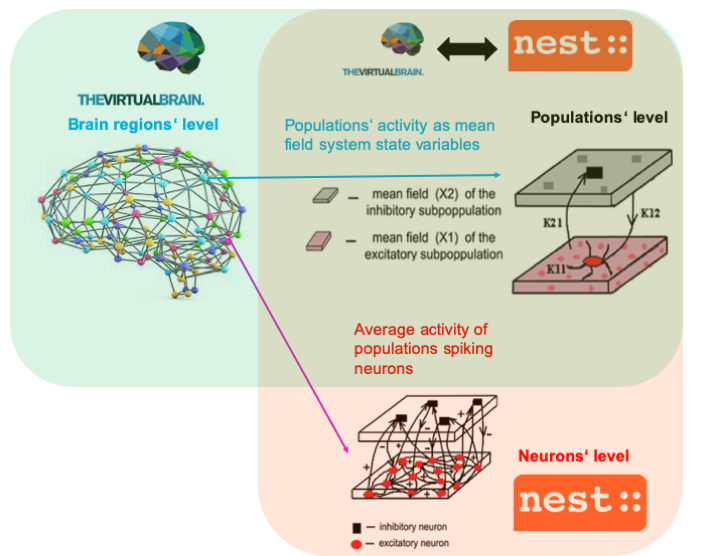

In [1]:
from IPython.core.display import Image, display
display(Image(filename='./ConceptGraph.png',  width=1000, unconfined=False))

## tvb-multiscale toolbox:

### https://github.com/the-virtual-brain/tvb-multiscale

For questions use the git issue tracker, or write an e-mail to me: dionysios.perdikis@charite.de

### TVB - NEST co-simulation with Reduced Wong-Wang model

We demonstrate a multiscale simulation <br> of a reduced Wong-Wang model [3] <br> using TVB [1, 2] for brain region modelled at coarse scale, <br> and NEST [4] for regions modelled as <br> networks of spiking neural populations.

## Reduced Wong-Wang mean field model


Synaptic gating dynamics (i.e., proportion of synapse channels open at any given time):

$\dot{S_i}^{(E)} = - \frac{1}{\tau_E}{S_i}^{(E)} + (1-{S_i}^{(E)})\gamma_{E} {r_i}^{(E)}$

$\dot{S_i}^{(I)} = - \frac{1}{\tau_I}{S_i}^{(I)} + \gamma_I{r_i}^{(I)}$

where we bound ${S_i}^{(E/I)} \in $ [0.0, 1.0], 

and $ {r_i}^{(E/I)} $ is the firing rate given by:

$ {r_i}^{(E/I)} = H({I_{syn_i}}^{(E/I)}, a_{(E/I)}, b_{(E/I)}, d_{(E/I)}) $

where

$ H({I_{syn_i}}^{(E/I)},  a_{(E/I)}, b_{(E/I)}, d_{(E/I)}) = \frac{a_{(E/I)}{I_{syn_i}}^{(E/I)}-b_{(E/I)}}{1-e^{-d_{(E/I)}(a_{(E/I)}{I_{syn_i}}^{(E/I)}-b_{(E/I)})}}$ 

is a sigmoidal input->output function of the input synaptic current.

The total input synaptic current to excitatory populations is given by: 

$ {I_{syn_i}}^{(E)} = W_EI_o + w_+J_{NMDA}{S_i}^{(E)} - J_{i}{S_i}^{(I)} + GJ_{NMDA}\sum_{j\neq i}C_{ij}S_{j}^{(E)}(t-\tau_{ij})$

and to inhibitory ones:

$ {I_{syn_i}}^{(I)} = W_II_o + J_{NMDA}{S_i}^{(E)} - {S_i}^{(I)} +  \lambda GJ_{NMDA}\sum_{j\neq i}C_{ij}S_{j}^{(E)}(t-\tau_{ij})$

where 
$\lambda  \in${0, 1} for (not) allowing feedforward inhibition, respectively.

TVB connectivity weights $C_{ij}$ are scaled per "region"

## Reduced Wong-Wang mean field model

## Parameters following Ponce-Alvarez et al 2014:

- structural TVB connectivity weights $C_{ij}$
- structural TVB connectivity delays $\tau_{ij}$
- global structural brain connectivity coupling constant $G$
- overall effective external input current $I_o = 0.382nA$ 
- excitatory synaptic coupling $J_{NDMA} = 0.15nA$ 
- local feedback inhibitory synaptic coupling $J_{i} = 1.0nA$ 
- local excitatory recurrence $w_+ = 1.4$
- excitatory kinetic parameter $\gamma_E = 0.641 s$
- inhibitory kinetic parameter $\gamma_I = 1.0 s$
- excitatory (NMDA) time constant $\tau_E = \tau_{NMDA}=100ms$ 
- inhibitory (GABA) time constant $\tau_I = \tau_{GABA}=10ms$ 
- excitatory pool scaling constant $W_E = 1.0$
- inhibitory pool scaling constant $W_I = 0.7$
- excitatory sigmoidal functions parameters $a_{E} = 310nC^{-1}$, $b_{E} = 125Hz$, $d_{E} = 0.16s$
- inhibitory sigmoidal functions parameters $a_{I} = 615nC^{-1}$, $b_{I} = 177Hz$, $d_{I} = 0.087s$
- $\lambda = 1$, allowing for feedforward inhibition


## Spiking network model in NEST

For every neuron $i$ in region node $n$:


$ C_m{\dot{V}_{ni}}^m = - {I_{ni}}^L - {I_{ni}}^{AMPA} - {I_{ni}}^{NMDA} - {I_{ni} ^{GABA}}- \sum_{n\prime \neq n}{I_{n\prime \neq ni}}^{AMPA,ext} +{I_{ni}}^{ext} $

$\;\;\;\;\;\;\;\;\;\;=-g_m({V_{ni}}^m - V_L) $
              
$\;\;\;\;\;\;\;\;\;\;\;-g_{AMPA}({V_{ni}}^m - V_E)w_E{S_{ni}}^{AMPA} $

$\;\;\;\;\;\;\;\;\;\;\;-\frac{g_{NMDA}({V_{ni}}^m - V_E)}{1+\lambda_{NMDA}e^{-\beta{V_{ni}}^m}}w_E{S_{ni}}^{NMDA} $

$\;\;\;\;\;\;\;\;\;\;\;-g_{GABA}({V_{ni}}^m - V_I)w_I{S_{ni}}^{GABA} $

$\;\;\;\;\;\;\;\;\;\;\;-g_{AMPA,ext}({V_{ni}}^m - V_E)G\sum_{n\prime \neq n}C_{n\prime \neq n}{S_{n\prime \neq ni}}^{AMPA,ext} $

$\;\;\;\;\;\;\;\;\;\;\;+{I_{ni}}^{ext} $

$ {\dot{S}_{ni}}^{AMPA/GABA} = -\frac{1}{\tau_{AMPA/GABA,decay}}{S_{ni}}^{AMPA/GABA} + \left[ \sum_{j=1,j \neq i}^{N_{E/I}} \sum_k \delta(t-{t_j}^k) \right]_{j \in n}$

$ {\dot{X}_{ni}}^{NMDA} = -\frac{1}{\tau_{NMDA,rise}}{X_{ni}}^{NMDA} + \left[ \sum_{j=1,j \neq i}^{N_E} \sum_k \delta(t-{t_j}^k) \right]_{j \in n} $

$ {\dot{S}_{ni}}^{NMDA} = -\frac{1}{\tau_{NMDA,decay}}{S_{ni}}^{NMDA} + \alpha {X_{ni}}^{NMDA} (1 - \frac{1}{N_E-1}{S_{ni}}^{NMDA}) $

$ {\dot{S}_{n\prime \neq ni}}^{AMPA,ext} = -\frac{1}{\tau_{AMPA,decay}}{S_{n\prime \neq ni}}^{AMPA,ext} + \left[ \sum_{j=1}^{N_E} \sum_k \delta(t-{t_j}^k) \right]_{j \in n\prime, n\prime \neq n} $

Boundaries assuming that self-connections of neurons are not possible:

For excitatory neurons:

$ {S_{exc}}^{AMPA/NMDA} \in [0.0, N_E-1]$

$ {S_{exc}}^{GABA} \in [0.0, N_I]$

For inhibitory neurons:

$ {S_{inh}}^{AMPA/NMDA} \in [0.0, N_E]$

$ {S_{inh}}^{GABA} \in [0.0, N_I-1]$

For all neurons:

$ {S_{exc/inh}}^{AMPA,ext} \in [0.0, N_E]$

When $V_m > V_{th}$, emit a spike and clamp $V_m$ to $V_{reset}$ for $\tau_{ref}$ ms.


## Interfacing (coupling) TVB $\rightarrow$ NEST

#### Coupling a TVB region node state variable to a NEST population of a brain region node.

We assume that at each NEST region node, we place an excitatory (E) and an inhibitory (I) population of spiking neurons


### A. Current

$ TVB \big\{ N_E * GJ_{NMDA}\sum_{n'\in TVB->n\in NEST}C_{nn'}S_{n}^{(E)}(t-\tau_{nn'}) \big\} \rightarrow NEST \big\{ {I_{ext_i}} ^ {(E/I,\; n\in NEST)} \big\} $

#### 1. Using NEST dc generator stimulating devices as TVB "proxy" nodes:

$interfaceWeight_{𝑛′∈𝑇𝑉𝐵} * TVB \big\{ N_E * J_{NMDA}S_{𝑛′∈𝑇𝑉𝐵}^{(E)}(t) \big\} $ 
    
$\;\;\;\;\;\; \rightarrow NEST \big\{ "TVB \; proxy \; nodes \; as \; NEST \; dc \; generators" \;: $

$ \;\;\;\;\;\;\;\;\; interfaceWeight_{𝑛′∈𝑇𝑉𝐵} * N_E * J_{NMDA}C_{nn'}S_{𝑛′∈𝑇𝑉𝐵}^{(E)}(t-\tau_{nn}') \big\}$
    
$\;\;\;\;\;\;\;\;\;\;\;\; \rightarrow NEST \big\{ {I_{ext_i}} ^ {(E/I,\; n\in NEST)} \big\} $


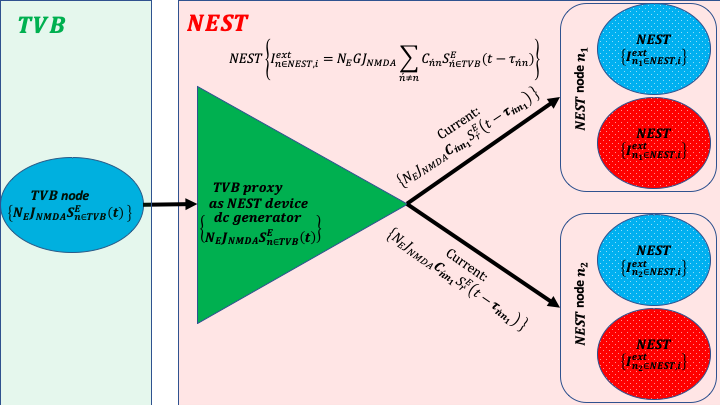

In [2]:
display(Image(filename='./DC.png',  width=1000, unconfined=False))

#### 2. Directly setting ${I_{ext_i}} ^ {(E/I,\; n\in NEST)}$ NEST parameter with TVB coupling input:

$interfaceWeight_{n\in NEST} \big\{ N_E * GJ_{NMDA}\sum_{n'\in TVB->n\in NEST}C_{nn'}S_{n}^{(E)}(t-\tau_{nn'}) \big\} \rightarrow NEST \big\{ {I_{ext_i}} ^ {(E/I,\; n\in NEST)} \big\} $

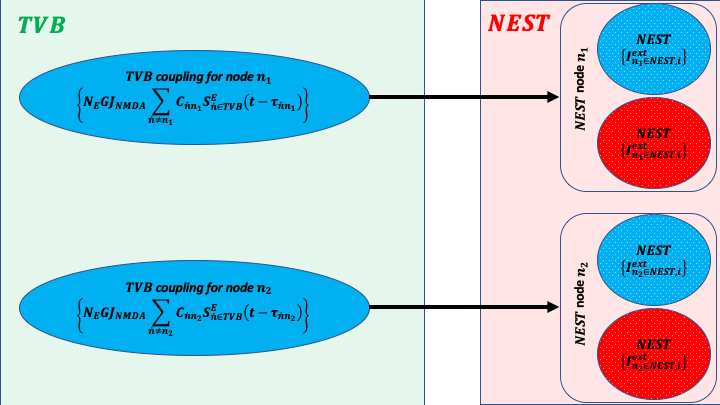

In [3]:
display(Image(filename='./Ie.png',  width=1000, unconfined=False))

### B.  Instantaneous mean  spike rate 
$interfaceWeight_{𝑛′∈𝑇𝑉𝐵}TVB \big\{ r_{𝑛′∈𝑇𝑉𝐵}^{(E)}(t) \big\} $ 
    
$\;\;\;\;\;\; \rightarrow NEST \big\{  "TVB \; proxy \; nodes \; as \; NEST \; poisson \; generators"\;: $

$\;\;\;\;\;\;\;\;\;\;\;\;\;\;\;\;\;\;\;\;\;\;\;\;\;\;\;\;\;\;\;  
\sum_{i\in N_{(E/I)}}\sum_k\delta(t-({t_i}^k + \tau_{nn'})) \big \} $

$\;\;\;\;\;\;\;\;\;\;\;\;\;\;\;\;\;\;\;\;\;\;\;\;\;\;\;\;\;\;\;\;\;\;\;\;\;\;\;\; 
\rightarrow NEST \big \{ {I_{syn_i}} ^ {(E/I,\; n\in NEST)} \big\} $

where $\delta(t) = 1$ for $t=0$, and 0 otherwise

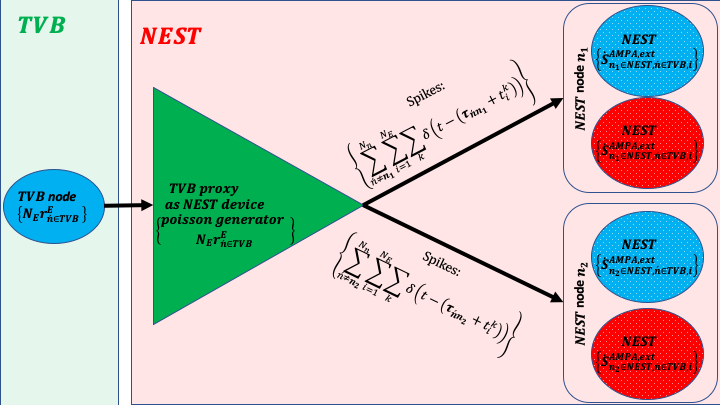

In [4]:
display(Image(filename='./Rate.png',  width=1000, unconfined=False))

## Interfacing (updating) TVB $\leftarrow$ NEST

### Instantaneous mean spike rate 

$TVB${$r_{n\in NEST}^{(E/I)}$}$ \leftarrow N_{n\in NEST}$ "spike detector devices" { $\frac{{{\sum_{i\in N_{(E/I)}}\sum_k\delta(t-{t_i}^k)}_{n\in NEST}}}{N_{E/I}} * \frac{1}{dt}$}

where $dt$ is the TVB integration time step

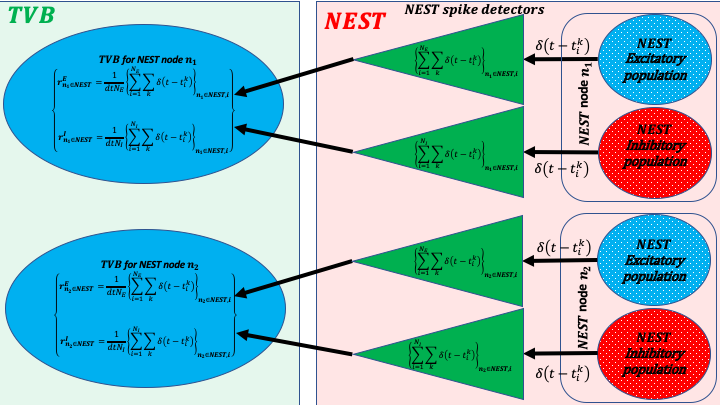

In [5]:
display(Image(filename='./NEST->TVB.png',  width=1000, unconfined=False))

## Simulator loop

### Simulating several (i.e., 10) NEST time steps for every 1 TVB time step for stable integration

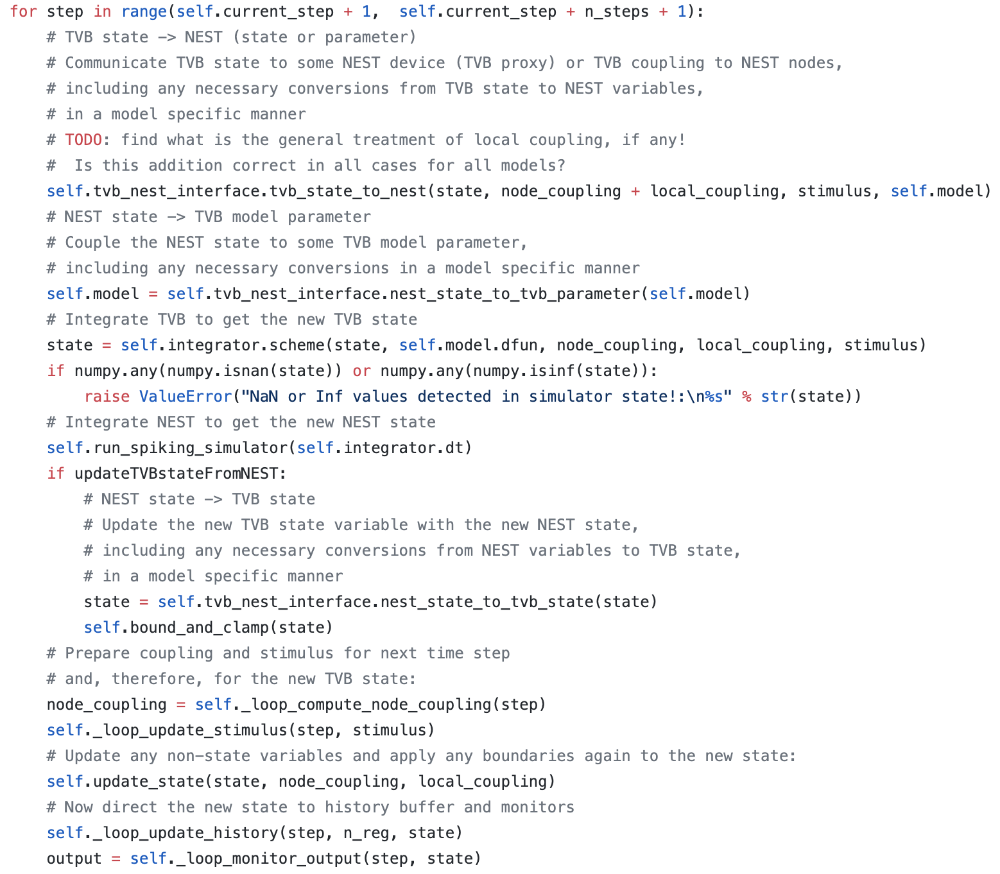

In [6]:
display(Image(filename='./simulator_loop.png',  width=600, unconfined=False))

In [7]:
from collections import OrderedDict
import time
import numpy as np

from tvb.basic.profile import TvbProfile
TvbProfile.set_profile(TvbProfile.LIBRARY_PROFILE)

from tvb_nest.config import *
config = Config()
config.figures.SHOW_FLAG = True 
config.figures.SAVE_FLAG = True
config.figures.FIG_FORMAT = 'png'

from tvb_nest.plot.plotter import Plotter
plotter = Plotter(config)

# For interactive plotting:
# %matplotlib notebook  

# Otherwise:
%matplotlib inline 

2019-12-19 12:07:00,290 - INFO - numexpr.utils - NumExpr defaulting to 6 threads.


/home/docker/packages/tvb-root/scientific_library/tvb/datatypes/surfaces.py:61: UserWarning: Geodesic distance module is unavailable; some functionality for surfaces will be unavailable.
  warnings.warn(msg)


2019-12-19 12:07:01,344 - DEBUG - matplotlib - $HOME=/home/docker
2019-12-19 12:07:01,345 - DEBUG - matplotlib - CONFIGDIR=/home/docker/.config/matplotlib
2019-12-19 12:07:01,350 - DEBUG - matplotlib - matplotlib data path: /usr/share/matplotlib/mpl-data
2019-12-19 12:07:01,351 - DEBUG - matplotlib - loaded rc file /etc/matplotlibrc
2019-12-19 12:07:01,353 - DEBUG - matplotlib - matplotlib version 3.0.2
2019-12-19 12:07:01,354 - DEBUG - matplotlib - interactive is False
2019-12-19 12:07:01,355 - DEBUG - matplotlib - platform is linux
2019-12-19 12:07:01,357 - DEBUG - matplotlib - loaded modules: ['sys', 'builtins', '_frozen_importlib', '_imp', '_thread', '_warnings', '_weakref', 'zipimport', '_frozen_importlib_external', '_io', 'marshal', 'posix', 'encodings', 'codecs', '_codecs', 'encodings.aliases', 'encodings.utf_8', '_signal', '__main__', 'encodings.latin_1', 'io', 'abc', '_abc', '_bootlocale', '_locale', 'site', 'os', 'stat', '_stat', 'posixpath', 'genericpath', 'os.path', '_colle

2019-12-19 12:07:01,400 - DEBUG - matplotlib - CACHEDIR=/home/docker/.cache/matplotlib
2019-12-19 12:07:01,403 - DEBUG - matplotlib.font_manager - Using fontManager instance from /home/docker/.cache/matplotlib/fontlist-v300.json
2019-12-19 12:07:01,519 - DEBUG - matplotlib.pyplot - Loaded backend agg version unknown.
2019-12-19 12:07:02,009 - WARNING - tvb.traits - Field seems mutable and has a default value. Consider using a lambda as a value factory 
   attribute tvb.datatypes.projections.ProjectionMatrix.conductances = Attr(field_type=<class 'dict'>, default={'air': 0.0, 'skin': 1.0, 'skull': 0.01, 'brain': 1.0}, required=False)
2019-12-19 12:07:02,034 - WARNING - tvb.traits - Field seems mutable and has a default value. Consider using a lambda as a value factory 
   attribute tvb.datatypes.time_series.TimeSeries.labels_dimensions = Attr(field_type=<class 'dict'>, default={}, required=True)
2019-12-19 12:07:02,211 - DEBUG - matplotlib.pyplot - Loaded backend module://ipykernel.pylab

## 1. Load structural data <br> (minimally a TVB connectivity)

2019-12-19 12:07:02,299 - DEBUG - matplotlib.colorbar - locator: <matplotlib.colorbar._ColorbarAutoLocator object at 0x7f488e527550>
2019-12-19 12:07:02,301 - DEBUG - matplotlib.colorbar - Using auto colorbar locator on colorbar
2019-12-19 12:07:02,302 - DEBUG - matplotlib.colorbar - locator: <matplotlib.colorbar._ColorbarAutoLocator object at 0x7f488e527550>
2019-12-19 12:07:02,304 - DEBUG - matplotlib.colorbar - Setting pcolormesh
2019-12-19 12:07:02,421 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:07:02,422 - DEBUG - matplotlib.axes._base - not adjusting title pos because title was already placed manually: 1.050000
2019-12-19 12:07:02,450 - DEBUG - matplotlib.font_manager - findfont: Matching :family=sans-serif:style=normal:variant=normal:weight=normal:stretch=normal:size=8.0 to DejaVu Sans ('/usr/share/matplotlib/mpl-data/fonts/ttf/DejaVuSans.ttf') with score of 0.050000.
2019-12-19 12:07:02,695 - DEBUG - matplotlib.font_manager - findfont: Matching :family=sans

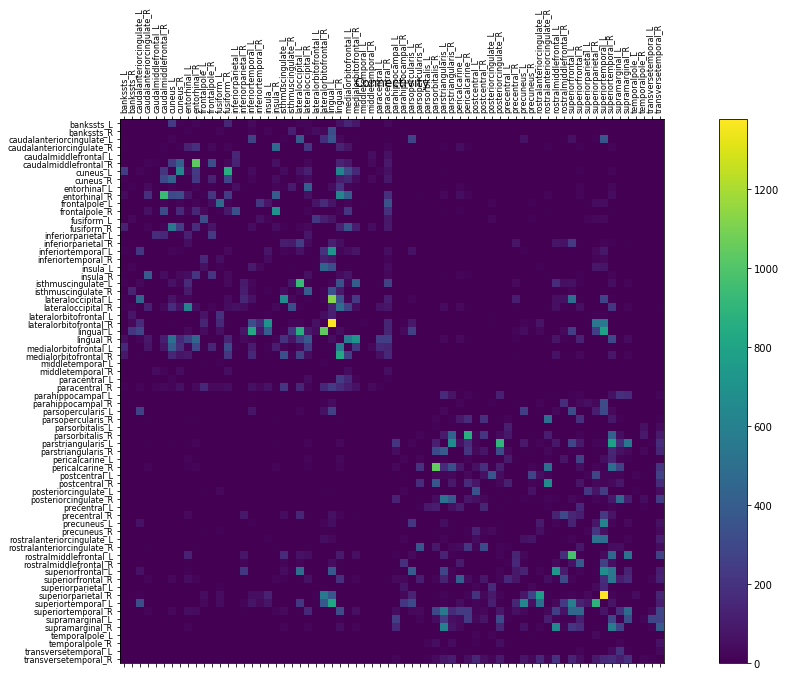

2019-12-19 12:07:04,362 - DEBUG - matplotlib.colorbar - locator: <matplotlib.colorbar._ColorbarAutoLocator object at 0x7f488e3a8470>
2019-12-19 12:07:04,362 - DEBUG - matplotlib.colorbar - Using auto colorbar locator on colorbar
2019-12-19 12:07:04,363 - DEBUG - matplotlib.colorbar - locator: <matplotlib.colorbar._ColorbarAutoLocator object at 0x7f488e3a8470>
2019-12-19 12:07:04,364 - DEBUG - matplotlib.colorbar - Setting pcolormesh
2019-12-19 12:07:04,464 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:07:04,465 - DEBUG - matplotlib.axes._base - not adjusting title pos because title was already placed manually: 1.050000
2019-12-19 12:07:04,727 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:07:04,828 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:07:04,829 - DEBUG - matplotlib.axes._base - title position was updated manually, not adjusting
2019-12-19 12:07:05,105 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:07:05,

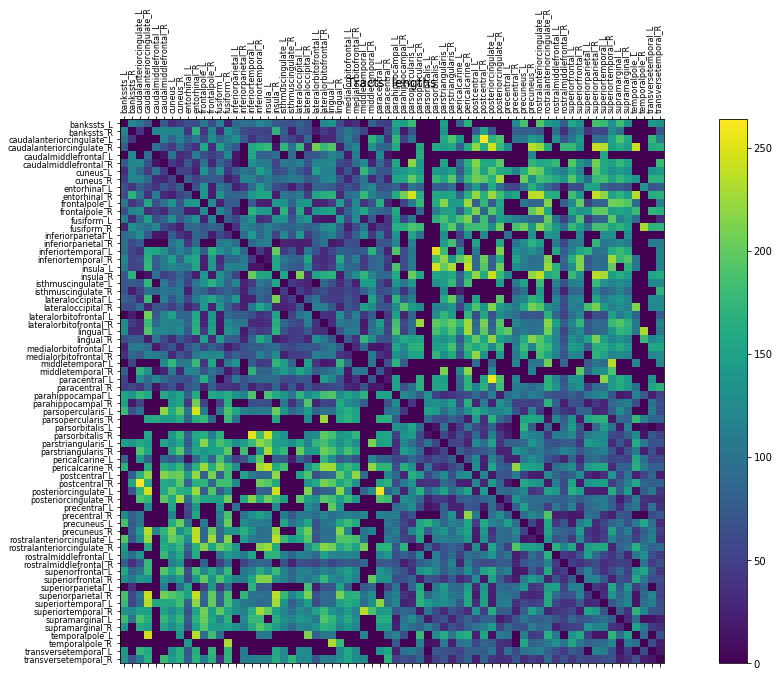

(<Figure size 1440x720 with 2 Axes>,
 <Figure size 1440x720 with 2 Axes>,
 <matplotlib.axes._subplots.AxesSubplot at 0x7f4889718d68>)

In [8]:
from tvb.datatypes.connectivity import Connectivity
connectivity = Connectivity.from_file(config.DEFAULT_CONNECTIVITY_ZIP)
connectivity.configure()
plotter.plot_tvb_connectivity(connectivity)

## 2. Prepare TVB simulator <br> (region mean field model, integrator, monitors etc)

In [9]:
from tvb_nest.simulator_tvb.simulator import Simulator
from tvb_nest.simulator_tvb.models.reduced_wong_wang_exc_io_inh_i \
    import ReducedWongWangExcIOInhI
from tvb.simulator.monitors import Raw  # , Bold, EEG

# Create a TVB simulator and set all desired inputs
# (connectivity, model, surface, stimuli etc)
# We choose all defaults in this example
simulator = Simulator()
simulator.model = ReducedWongWangExcIOInhI()
simulator.model.J_i = np.array([0.1, ]) # Feedback inhibition

simulator.connectivity = connectivity
simulator.integrator.dt = \
    float(int(np.round(simulator.integrator.dt / 
                       config.nest.NEST_MIN_DT))) * config.nest.NEST_MIN_DT
simulator.integrator.noise.nsig = np.array([0.001])

mon_raw = Raw(period=simulator.integrator.dt)
# Some extra monitors for neuroimaging measures:
# mon_bold = Bold(period=2000.)
# mon_eeg = EEG(period=simulator.integrator.dt)
simulator.monitors = (mon_raw, )  # mon_bold, mon_eeg

2019-12-19 12:07:06,443 - WARNING - tvb.simulator.common - psutil module not available: no warnings will be issued when a
    simulation may require more memory than available
2019-12-19 12:07:06,455 - WARNING - tvb.traits - default contains values out of the declared domain. Ex 1.0 
   attribute  tvb.simulator.coupling.HyperbolicTangent.b = NArray(label=':math:`b`', dtype=float64, default=array([1.]), dim_names=(), ndim=None, required=True)
2019-12-19 12:07:06,460 - WARNING - tvb.traits - default contains values out of the declared domain. Ex 1.0 
   attribute  tvb.simulator.coupling.Kuramoto.a = NArray(label=':math:`a`', dtype=float64, default=array([1.]), dim_names=(), ndim=None, required=True)
2019-12-19 12:07:06,641 - WARNING - tvb.traits - default contains values out of the declared domain. Ex 1.0 
   attribute  tvb.simulator.models.oscillator.Generic2dOscillator.gamma = NArray(label=':math:`\\gamma`', dtype=float64, default=array([1.]), dim_names=(), ndim=None, required=True)
20

## 3. Build and connect the NEST network model <br> (networks of spiking neural populations for fine-scale <br>regions, stimulation devices, spike detectors etc)

In [10]:
# Select the regions for the fine scale modeling with NEST spiking networks
number_of_regions = simulator.connectivity.region_labels.shape[0]
nest_nodes_ids = []  # the indices of fine scale regions modeled with NEST
# We model parahippocampal cortices (left and right) with NEST
for id in range(number_of_regions):
    if simulator.connectivity.region_labels[id].find("hippo") > 0:
        nest_nodes_ids.append(id)
        
from tvb_nest.simulator_nest.builders.models.ww_deco2014 \
    import WWDeco2014Builder

# Build a NEST network model with the corresponding builder
# Using all default parameters for this example
nest_model_builder = WWDeco2014Builder(simulator, nest_nodes_ids, config=config)


# or...

# ----------------------------------------------------------------------------------------------------------------
# ----Uncomment below to modify the builder by changing the default options:--------------------------------------
# ----------------------------------------------------------------------------------------------------------------

nest_model_builder.population_order = 100

exc_pop_scale=1.0
inh_pop_scale=0.7
exc_pop_size = int(nest_model_builder.population_order * exc_pop_scale)
inh_pop_size = int(nest_model_builder.population_order * inh_pop_scale)

common_params = {
    "V_th": -50.0,  # mV    
    "V_reset": -55.0,  # mV  
    "E_L": -70.0,  # mV 
    "E_ex": 0.0,   # mV
    "E_in": -70.0,  # mV
    "tau_decay_AMPA": 2.0,    # ms
    "tau_decay_GABA_A": 10.0,  # ms
    "tau_decay_NMDA": 100.0,  # ms
    "tau_rise_NMDA": 2.0,  # ms
    "s_AMPA_ext_max": exc_pop_size*np.ones((nest_model_builder.number_of_nodes, )).astype("f")
    }
params_ex = dict(common_params)
params_ex.update({
    "C_m": 500.0,  # pF
    "g_L": 25.0,  # nS
    "t_ref": 2.0,  # ms
    "g_AMPA_ext": 3.37,  # nS
    "g_AMPA": 0.065,  # nS 
    "g_NMDA": 0.20,  # nS
    "g_GABA_A": 10.94,  # nS
    "w_E": nest_model_builder.tvb_model.w_p[0],  #w+ in the paper
    "w_I": nest_model_builder.tvb_model.J_i[0],
    "N_E": exc_pop_size-1,
    "N_I": inh_pop_size
    })
params_in = dict(common_params)
params_in.update({
    "C_m": 200.0,  # pF
    "g_L": 20.0,  # nS
    "t_ref": 1.0,  # ms
    "g_AMPA_ext": 2.59,  # nS
    "g_AMPA": 0.051,  # nS
    "g_NMDA": 0.16,  # nS
    "g_GABA_A": 8.51,  # nS
    "w_E": 1.0, 
    "w_I": 1.0,
    "N_E": exc_pop_size,
    "N_I": inh_pop_size-1
    })

def param_fun(node_index, params):
    out_params = dict(params)
    out_params.update({"w_E_ext": nest_model_builder.tvb_model.G[0] *
                       nest_model_builder.tvb_weights[:, list(nest_model_builder.nest_nodes_ids).index(node_index)]})
    return out_params

# Populations' configurations
# When any of the properties model, params and scale below depends on regions,
# set a handle to a function with
# arguments (region_index=None) returning the corresponding property

nest_model_builder.populations = [
    {"label": "E", "model": "iaf_cond_deco2014", "nodes": None,  # None means "all"
     "params": lambda node_index: param_fun(node_index, params_ex),
     "scale": exc_pop_scale},
   {"label": "I", "model": "iaf_cond_deco2014", "nodes": None,  # None means "all"
    "params": lambda node_index: param_fun(node_index, params_in),
     "scale": 1.0}
  ]

# Within region-node connections
# When any of the properties model, conn_spec, weight, delay, receptor_type below
# set a handle to a function with
# arguments (region_index=None) returning the corresponding property
nest_model_builder.populations_connections = [
     #              ->
    {"source": "E", "target": "E",  # E -> E This is a self-connection for population "E"
     "model": nest_model_builder.default_populations_connection["model"],
     "conn_spec": nest_model_builder.default_populations_connection["conn_spec"],
     "weight": 1.0,
     "delay": nest_model_builder.default_populations_connection["delay"],
     "receptor_type": 0, "nodes": None},  # None means "all"
     #              ->
    {"source": "E", "target": "I",  # E -> I
     "model": nest_model_builder.default_populations_connection["model"],
     "conn_spec": nest_model_builder.default_populations_connection["conn_spec"],
     "weight": 1.0,
     "delay": nest_model_builder.default_populations_connection["delay"],
     "receptor_type": 0, "nodes": None},  # None means "all"
     #              ->
    {"source": "I", "target": "E",  # I -> E
     "model": nest_model_builder.default_populations_connection["model"],
     "conn_spec": nest_model_builder.default_populations_connection["conn_spec"],
     "weight": -1.0,
     "delay": nest_model_builder.default_populations_connection["delay"],
     "receptor_type": 0, "nodes": None},  # None means "all"
     #              ->
    {"source": "I", "target": "I",  # I -> I This is a self-connection for population "I"
     "model": nest_model_builder.default_populations_connection["model"],
     "conn_spec": nest_model_builder.default_populations_connection["conn_spec"],
     "weight": -1.0,
     "delay": nest_model_builder.default_populations_connection["delay"],
     "receptor_type": 0, "nodes": None}  # None means "all"
    ]


# Among/Between region-node connections
# Given that only the AMPA population of one region-node couples to
# all populations of another region-node,
# we need only one connection type
        
# When any of the properties model, conn_spec, weight, delay, receptor_type below
# depends on regions, set a handle to a function with
# arguments (source_region_index=None, target_region_index=None)

def weight_fun(tvb_node_id, nest_node_id, tvb_weights):
    if tvb_weights[tvb_node_id, nest_node_id] > 0.0:
        return 1 / tvb_weights[tvb_node_id, nest_node_id]
    else:
        return 0.0
    
nest_model_builder.nodes_connections = [
    #              ->
    {"source": "E", "target": ["E", "I"],
     "model": nest_model_builder.default_nodes_connection["model"],
     "conn_spec": nest_model_builder.default_nodes_connection["conn_spec"],
   #  weight scaling the TVB connectivity weight
     "weight": 
         lambda tvb_node_id, nest_node_id: 
             weight_fun(tvb_node_id, nest_node_id, nest_model_builder.tvb_weights),
   # additional delay to the one of TVB connectivity
     "delay": 0.0, # nest_model_builder.default_nodes_connection["delay"],  
    # Each region emits spikes in its own port:
     "receptor_type": lambda source_region_index, target_region_index=None: int(source_region_index + 1),
     "source_nodes": None, "target_nodes": None}  # None means "all"
    ]


# Creating  devices to be able to observe NEST activity:
# Labels have to be different
nest_model_builder.output_devices = []
connections = OrderedDict({})
#          label <- target population
connections["E"] = "E"
connections["I"] = "I"
nest_model_builder.output_devices.append(
    {"model": "spike_detector", "params": {},
     "connections": connections, "nodes": None})  # None means "all"

connections = OrderedDict({})
#               label    <- target population
connections["Excitatory"] = "E"
connections["Inhibitory"] = "I"
params = dict(nest_model_builder.config.nest.NEST_OUTPUT_DEVICES_PARAMS_DEF["multimeter"])
params["interval"] = nest_model_builder.nest_instance.GetKernelStatus("resolution")  # self.monitor_period
params['record_from'] = ["V_m",
                         "s_AMPA", "x_NMDA", "s_NMDA", "s_GABA",
                         "I_AMPA", "I_NMDA", "I_GABA", "I_L", "I_e",
                         "spikes_exc", "spikes_inh"
                        ]
for i_node in range(nest_model_builder.number_of_nodes):
    params['record_from'].append("s_AMPA_ext_%d" % i_node)
    params['record_from'].append("I_AMPA_ext_%d" % i_node)
    params['record_from'].append("spikes_exc_ext_%d" % i_node)

nest_model_builder.output_devices.append(
    {"model": "multimeter", "params": params,
     "connections": connections, "nodes": None})  # None means "all"
    
# ----------------------------------------------------------------------------------------------------------------
# ----------------------------------------------------------------------------------------------------------------
# ----------------------------------------------------------------------------------------------------------------

nest_network = nest_model_builder.build_nest_network()
nest_model_builder.nest_instance.GetStatus((1,))


2019-12-19 12:07:07,785 - WARNING - tvb.traits - Field seems mutable and has a default value. Consider using a lambda as a value factory 
   attribute tvb.simulator.models.wilson_cowan.WilsonCowan.state_variable_range = Final(field_type=<class 'dict'>, default={'E': array([0., 1.]), 'I': array([0., 1.])}, required=True)
2019-12-19 12:07:07,789 - WARNING - tvb.traits - Field seems mutable and has a default value. Consider using a lambda as a value factory 
   attribute tvb_nest.simulator_tvb.models.wilson_cowan_constraint.WilsonCowan.state_variable_boundaries = Final(field_type=<class 'dict'>, default={'E': array([0., 1.]), 'I': array([0., 1.])}, required=True)
2019-12-19 12:07:07,790 - WARNING - tvb.traits - Field seems mutable and has a default value. Consider using a lambda as a value factory 
   attribute tvb_nest.simulator_tvb.models.wilson_cowan_constraint.WilsonCowan.state_variable_range = Final(field_type=<class 'dict'>, default={'E': array([0., 1.]), 'I': array([0., 1.])}, requ

2019-12-19 12:07:08,725 - INFO - tvb_nest.simulator_nest.builders.base - Trying to install module iaf_cond_deco2014module...
2019-12-19 12:07:08,725 - INFO - tvb_nest.simulator_nest.builders.base - Trying to install module iaf_cond_deco2014module...
2019-12-19 12:07:08,838 - INFO - tvb_nest.simulator_nest.models.devices - <class 'tvb_nest.simulator_nest.models.devices.NESTDeviceSet'> of model spike_detector for E created!
2019-12-19 12:07:08,838 - INFO - tvb_nest.simulator_nest.models.devices - <class 'tvb_nest.simulator_nest.models.devices.NESTDeviceSet'> of model spike_detector for E created!
2019-12-19 12:07:08,847 - INFO - tvb_nest.simulator_nest.models.devices - <class 'tvb_nest.simulator_nest.models.devices.NESTDeviceSet'> of model spike_detector for I created!
2019-12-19 12:07:08,847 - INFO - tvb_nest.simulator_nest.models.devices - <class 'tvb_nest.simulator_nest.models.devices.NESTDeviceSet'> of model spike_detector for I created!
2019-12-19 12:07:08,861 - INFO - tvb_nest.simu

({'alpha': 0.5,
  'archiver_length': 0,
  'beta': 0.062,
  'beta_Ca': 0.001,
  'C_m': 500.0,
  'Ca': 0.0,
  'E_ex': 0.0,
  'E_in': -70.0,
  'E_L': -70.0,
  'element_type': <SLILiteral: neuron>,
  'frozen': False,
  'g_AMPA': 0.065,
  'g_GABA_A': 10.94,
  'g_L': 25.0,
  'g_NMDA': 0.2,
  'global_id': 1,
  'gsl_error_tol': 1e-06,
  'has_connections': True,
  'I_e': 0.0,
  'local': True,
  'local_id': 1,
  'model': <SLILiteral: iaf_cond_deco2014>,
  'n_receptors': 68,
  'node_uses_wfr': False,
  'parent': 0,
  'post_trace': 0.0,
  'recordables': (<SLILiteral: I_e>,
   <SLILiteral: V_m>,
   <SLILiteral: s_AMPA>,
   <SLILiteral: s_GABA>,
   <SLILiteral: x_NMDA>,
   <SLILiteral: s_NMDA>,
   <SLILiteral: I_L>,
   <SLILiteral: I_AMPA>,
   <SLILiteral: I_NMDA>,
   <SLILiteral: I_GABA>,
   <SLILiteral: spikes_exc>,
   <SLILiteral: spikes_inh>,
   <SLILiteral: s_AMPA_ext_0>,
   <SLILiteral: I_AMPA_ext_0>,
   <SLILiteral: spikes_exc_ext_0>,
   <SLILiteral: s_AMPA_ext_1>,
   <SLILiteral: I_AMPA_ext_

## 4. Build the TVB-NEST interface

In [11]:
from tvb_nest.interfaces.builders.models.ww_deco2014 import WWDeco2014Builder as InterfaceWWDeco2014Builder

# Build a TVB-NEST interface with all the appropriate connections between the
# TVB and NEST modelled regions
# Using all default parameters for this example
tvb_nest_builder = InterfaceWWDeco2014Builder(simulator, nest_network, nest_nodes_ids, 
                                              N_E=100, exclusive_nodes=True)
# or...

# ----------------------------------------------------------------------------------------------------------------
# ----Uncomment below to modify the builder by changing the default options:--------------------------------------
# ----------------------------------------------------------------------------------------------------------------

N_E = 100 # The number of excitatory neurons per region

# TVB -> NEST

# # For directly setting an external current parameter in NEST neurons instantaneously:
# tvb_nest_builder.tvb_to_nest_interfaces = [
#     {"model": "current",  "parameter": "I_e",
# # ---------Properties potentially set as function handles with args (nest_node_id=None)---------------------------
#      "interface_weights": 1.0 * N_E,
# # ----------------------------------------------------------------------------------------------------------------
# #                  TVB sv -> NEST population
#      "connections": {"S_e": ["E", "I"]},
#      "nodes": None}]  # None means all here


# # For injecting current to NEST neurons via dc generators acting as TVB proxy nodes with TVB delays:
# tvb_nest_builder.tvb_to_nest_interfaces = [
#     {"model": "dc_generator", "params": {},
# # ---------Properties potentially set as function handles with args (nest_node_id=None)---------------------------
# #   Applied outside NEST for each interface device
#      "interface_weights": 1.0 * N_E,
# # -------Properties potentially set as function handles with args (tvb_node_id=None, nest_node_id=None)-----------
# #    To multiply TVB connectivity weight:
#      "weights": simulator.model.G[0],
# #    To add to TVB connectivity delay:
#      "delays": nest_network.nodes_min_delay,
# # ----------------------------------------------------------------------------------------------------------------
# #    TVB sv -> NEST population
#      "connections": {"S_e": ["E", "I"]},
#      "source_nodes": None, "target_nodes": None}]  # None means all here

# For spike transmission from TVB to NEST devices acting as TVB proxy nodes with TVB delays:

def weight_fun(tvb_node_id, nest_node_id, tvb_weights):
    if tvb_weights[tvb_node_id, nest_node_id] > 0.0:
        return 1 / tvb_weights[tvb_node_id, nest_node_id]
    else:
        return 0.0
    
tvb_nest_builder.tvb_to_nest_interfaces = [
    {"model": "inhomogeneous_poisson_generator",
     "params": {"allow_offgrid_times": False},
# # ---------Properties potentially set as function handles with args (nest_node_id=None)-------------------------
     "interface_weights": 1.0 * N_E, 
# Applied outside NEST for each interface device
# -------Properties potentially set as function handles with args (tvb_node_id=None, nest_node_id=None)-----------
#   To multiply TVB connectivity weight:
    "weights": weight_fun,
#                                     To add to TVB connectivity delay:
    "delays": nest_network.nodes_min_delay,
    "receptor_types": lambda tvb_node_id, nest_node_id: int(tvb_node_id + 1),
    # --------------------------------------------------------------------------------------------------------------
    #             TVB sv -> NEST population
    "connections": {"R_e": ["E", "I"]},
    "source_nodes": None, "target_nodes": None}]  # None means all here


# NEST -> TVB:
# Use S_e and S_i instead of r_e and r_i
# for transmitting to the TVB state variables directly
connections = OrderedDict()
#            TVB <- NEST
connections["R_e"] = ["E"]
connections["R_i"] = ["I"]
nest_to_tvb_interfaces = [
    {"model": "spike_detector", "params": {},
# ------------------Properties potentially set as function handles with args (nest_node_id=None)--------------------
     "weights": 1.0, "delays": 0.0,
# -----------------------------------------------------------------------------------------------------------------
     "connections": connections, "nodes": None}]  # None means all here

tvb_nest_builder.w_tvb_to_current = 1000 * tvb_nest_builder.tvb_model.J_N[0]  # (nA of TVB -> pA of NEST)
# WongWang model parameter r is in Hz, just like poisson_generator assumes in NEST:
tvb_nest_builder.w_tvb_to_spike_rate = 1.0
# We return from a NEST spike_detector the ratio number_of_population_spikes / number_of_population_neurons
# for every TVB time step, which is usually a quantity in the range [0.0, 1.0],
# as long as a neuron cannot fire twice during a TVB time step, i.e.,
# as long as the TVB time step (usually 0.001 to 0.1 ms)
# is smaller than the neurons' refractory time, t_ref (usually 1-2 ms)
# For conversion to a rate, one has to do:
# w_spikes_to_tvb = 1/tvb_dt, to get it in spikes/ms, and
# w_spikes_to_tvb = 1000/tvb_dt, to get it in Hz
# given WongWang model parameter r is in Hz but tvb dt is in ms:
tvb_nest_builder.w_spikes_to_tvb = 1000.0 / tvb_nest_builder.tvb_dt
# ----------------------------------------------------------------------------------------------------------------
# ----------------------------------------------------------------------------------------------------------------
# ----------------------------------------------------------------------------------------------------------------

tvb_nest_model = tvb_nest_builder.build_interface()

2019-12-19 12:07:08,941 - INFO - tvb_nest.interfaces.base - <class 'tvb_nest.interfaces.models.RedWWexcIOinhI'> created!
2019-12-19 12:07:08,941 - INFO - tvb_nest.interfaces.base - <class 'tvb_nest.interfaces.models.RedWWexcIOinhI'> created!
2019-12-19 12:07:08,944 - INFO - tvb_nest.interfaces.models - <class 'tvb_nest.interfaces.models.RedWWexcIOinhI'> created!
2019-12-19 12:07:08,944 - INFO - tvb_nest.interfaces.models - <class 'tvb_nest.interfaces.models.RedWWexcIOinhI'> created!
2019-12-19 12:07:08,951 - INFO - tvb_nest.simulator_nest.models.devices - <class 'tvb_nest.simulator_nest.models.devices.NESTDeviceSet'> of model inhomogeneous_poisson_generator for R_e created!
2019-12-19 12:07:08,951 - INFO - tvb_nest.simulator_nest.models.devices - <class 'tvb_nest.simulator_nest.models.devices.NESTDeviceSet'> of model inhomogeneous_poisson_generator for R_e created!
2019-12-19 12:07:09,176 - INFO - tvb_nest.simulator_nest.models.devices - <class 'tvb_nest.interfaces.tvb_to_nest_device_i

## 5. Configure simulator, simulate, gather results

In [12]:
# Configure the simulator with the TVB-NEST interface...
simulator.configure(tvb_nest_interface=tvb_nest_model)
# ...and simulate!
t = time.time()
results = simulator.run(simulation_length=200.0)
# Integrate NEST one more NEST time step so that multimeters get the last time point
# unless you plan to continue simulation later
simulator.run_spiking_simulator(simulator.tvb_nest_interface.nest_instance.GetKernelStatus("resolution"))
# Clean-up NEST simulation
if simulator.run_spiking_simulator == simulator.tvb_nest_interface.nest_instance.Run:
    simulator.tvb_nest_interface.nest_instance.Cleanup()
print("\nSimulated in %f secs!" % (time.time() - t))


2019-12-19 12:07:11,358 - DEBUG - tvb_nest.simulator_tvb.models.reduced_wong_wang_exc_io_inh_i - building observer with code:
def observe(state):
    S_e,S_i,R_e,R_i = state
    return numpy.array([S_e,S_i,R_e,R_i])
2019-12-19 12:07:11,363 - INFO - tvb_nest.simulator_tvb.simulator - Region simulation with 68 ROI nodes
2019-12-19 12:07:11,363 - INFO - tvb_nest.simulator_tvb.simulator - Region simulation with 68 ROI nodes
2019-12-19 12:07:11,367 - DEBUG - tvb_nest.simulator_tvb.simulator - Estimated history shape is (879.3333333333334, 4, 68, 1)
2019-12-19 12:07:11,367 - DEBUG - tvb_nest.simulator_tvb.simulator - Estimated history shape is (879.3333333333334, 4, 68, 1)
2019-12-19 12:07:11,371 - INFO - tvb_nest.simulator_tvb.simulator - Memory requirement estimate: simulation will need about 4.4 MB
2019-12-19 12:07:11,371 - INFO - tvb_nest.simulator_tvb.simulator - Memory requirement estimate: simulation will need about 4.4 MB
2019-12-19 12:07:11,375 - DEBUG - tvb_nest.simulator_tvb.simul

In [13]:
# Gather the results
t = results[0][0]
source = results[0][1]

# Put the results in a Timeseries instance
from tvb_scripts.time_series.model import TimeSeriesRegion

source_ts = TimeSeriesRegion(source, time=t,
               connectivity=simulator.connectivity,
               labels_ordering=["Time", "Synaptic Gating Variable", "Region", "Neurons"],
               labels_dimensions=
                    {"Synaptic Gating Variable": ["S_e", "S_i", "R_e", "R_i"],
                     "Region": simulator.connectivity.region_labels.tolist()},
               sample_period=simulator.integrator.dt)
source_ts.configure()
source_ts

,value
Dimensions,"['Time', 'Synaptic Gating Variable', 'Region', 'Neurons']"
Length,200.0
Region Mapping,None
Region Mapping Volume,None
Sample period,0.1
Source Connectivity,Connectivity gid: 51dffbbd-d640-4479-88ac-b910c8400dd0
Time units,ms
Time-series name,TimeSeriesRegion gid: e8462165-812c-43b8-8cf3-fe6e194d6a4e
Time-series type,TimeSeriesRegion
"[min, median, max]","[0, 1, 6100]"


In [14]:
S_e = source_ts.get_state_variables("S_e")
S_i = source_ts.get_state_variables("S_i")
R_e = source_ts.get_state_variables("R_e")
R_i = source_ts.get_state_variables("R_i")

## Plot results

2019-12-19 12:11:07,569 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:11:07,892 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:11:08,059 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:11:08,349 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:11:08,553 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:11:08,684 - DEBUG - matplotlib.axes._base - update_title_pos


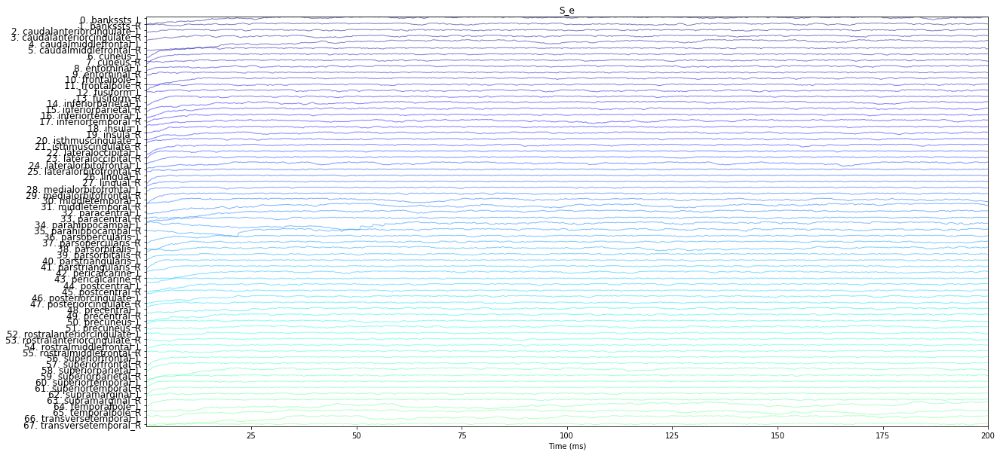

2019-12-19 12:11:09,067 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:11:09,316 - DEBUG - matplotlib.axes._base - update_title_pos


<Figure size 432x288 with 0 Axes>

2019-12-19 12:11:09,488 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:11:09,727 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:11:09,936 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:11:10,071 - DEBUG - matplotlib.axes._base - update_title_pos


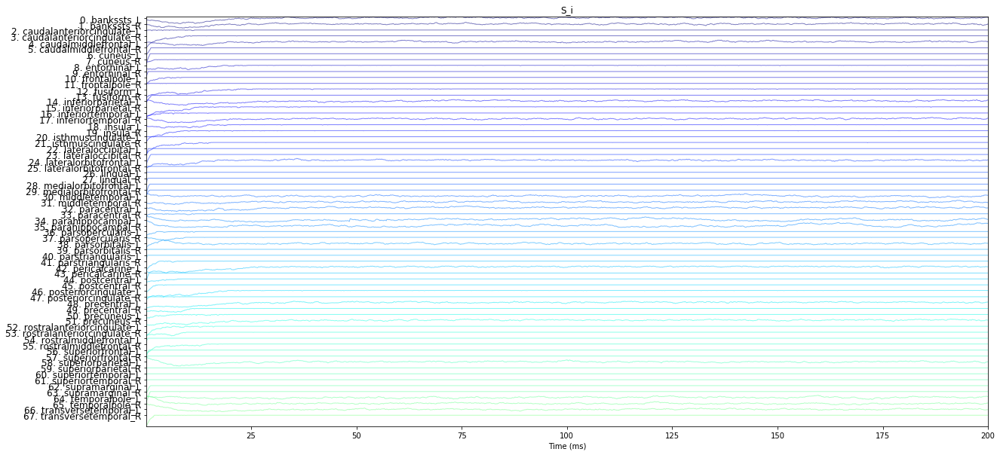

2019-12-19 12:11:10,386 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:11:10,634 - DEBUG - matplotlib.axes._base - update_title_pos


<Figure size 432x288 with 0 Axes>

2019-12-19 12:11:10,783 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:11:10,988 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:11:11,184 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:11:11,310 - DEBUG - matplotlib.axes._base - update_title_pos


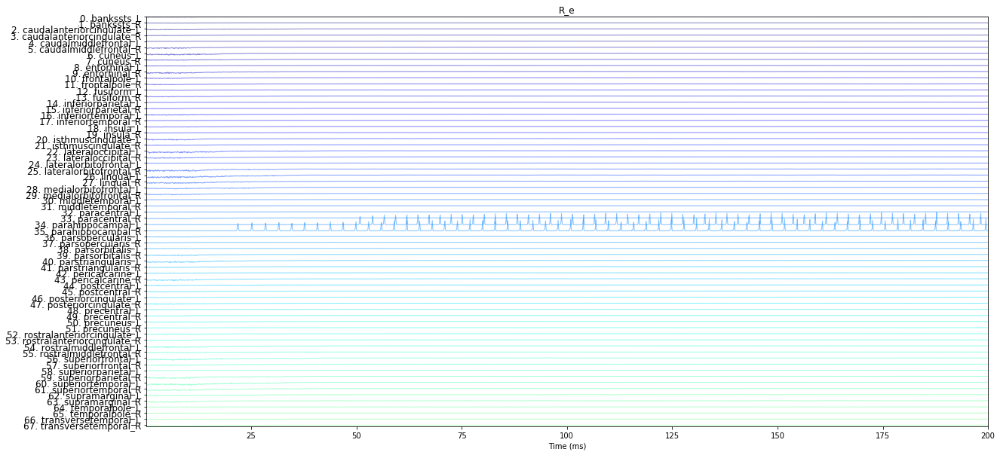

2019-12-19 12:11:11,615 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:11:11,904 - DEBUG - matplotlib.axes._base - update_title_pos


<Figure size 432x288 with 0 Axes>

2019-12-19 12:11:12,073 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:11:12,313 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:11:12,524 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:11:12,662 - DEBUG - matplotlib.axes._base - update_title_pos


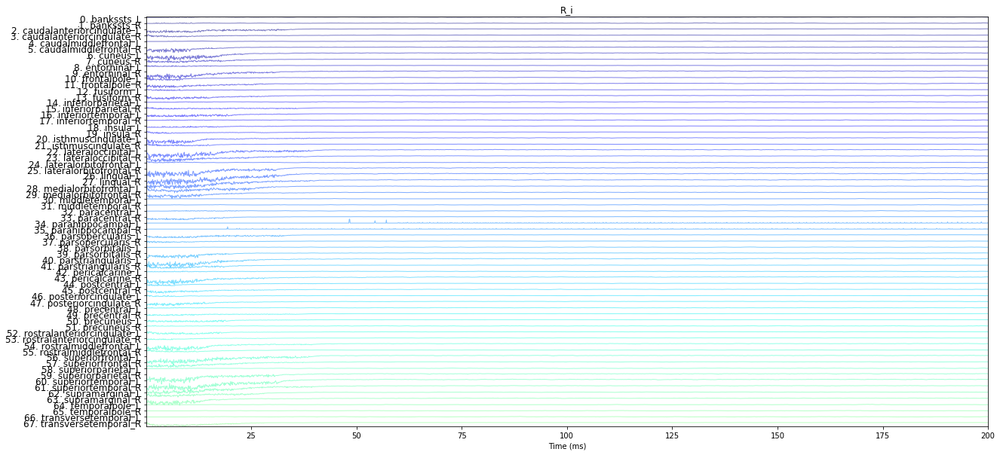

<Figure size 432x288 with 0 Axes>

In [15]:
# For raster plot:
plotter.plot_raster(S_e, title="Region S_e Time Series Raster", figsize=config.figures.NOTEBOOK_SIZE);
plotter.plot_raster(S_i, title="Region S_i Time Series Raster", figsize=config.figures.NOTEBOOK_SIZE);
plotter.plot_raster(R_e, title="Region R_e Time Series Raster", figsize=config.figures.NOTEBOOK_SIZE);
plotter.plot_raster(R_i, title="Region R_i Time Series Raster", figsize=config.figures.NOTEBOOK_SIZE);

2019-12-19 12:11:12,991 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:11:13,282 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:11:13,451 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:11:13,699 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:11:13,736 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:11:13,761 - DEBUG - matplotlib.axes._base - update_title_pos


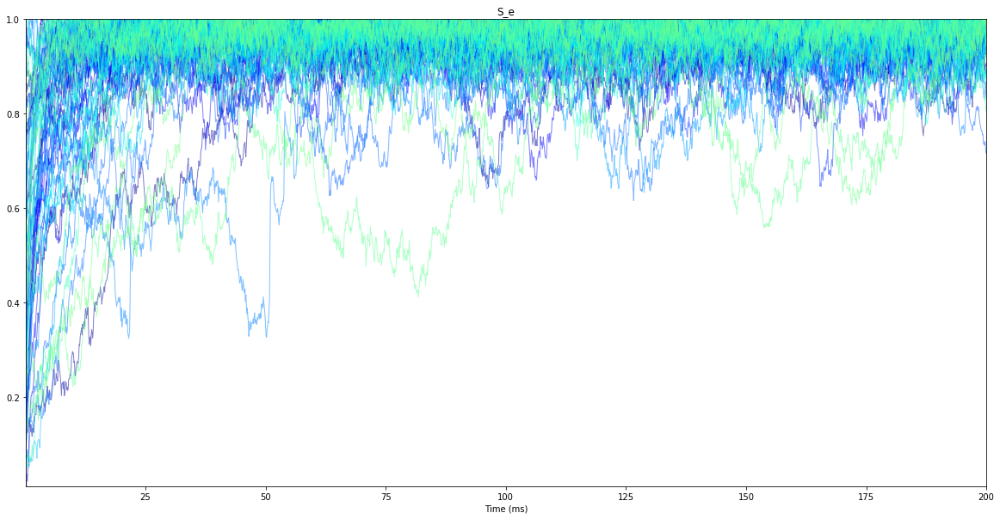

2019-12-19 12:11:14,081 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:11:14,359 - DEBUG - matplotlib.axes._base - update_title_pos


<Figure size 432x288 with 0 Axes>

2019-12-19 12:11:14,439 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:11:14,634 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:11:14,673 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:11:14,697 - DEBUG - matplotlib.axes._base - update_title_pos


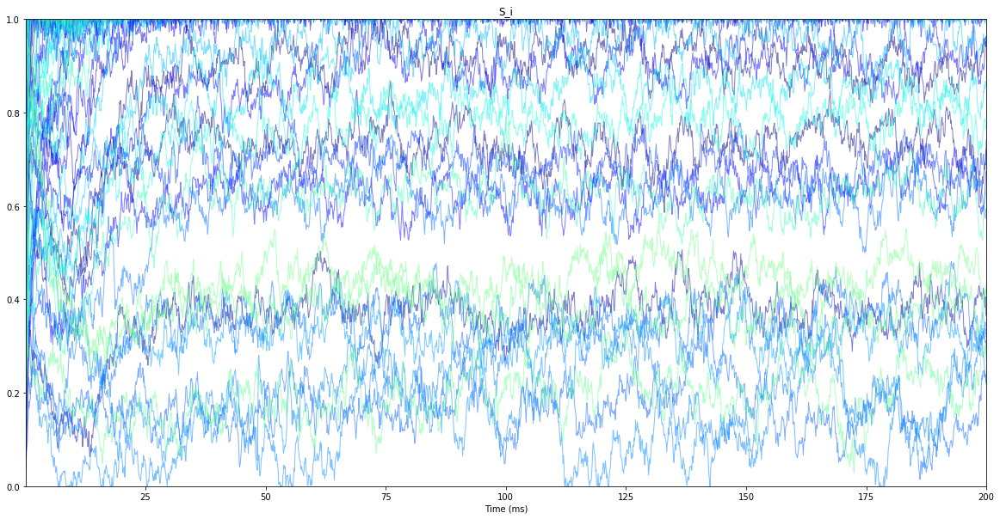

2019-12-19 12:11:15,069 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:11:15,304 - DEBUG - matplotlib.axes._base - update_title_pos


<Figure size 432x288 with 0 Axes>

2019-12-19 12:11:15,396 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:11:15,574 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:11:15,612 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:11:15,635 - DEBUG - matplotlib.axes._base - update_title_pos


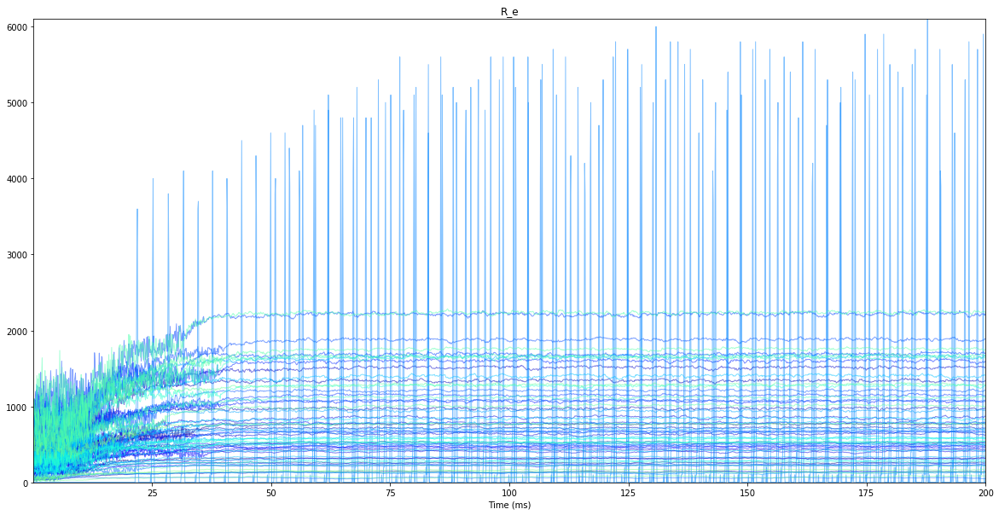

2019-12-19 12:11:15,883 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:11:16,201 - DEBUG - matplotlib.axes._base - update_title_pos


<Figure size 432x288 with 0 Axes>

2019-12-19 12:11:16,288 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:11:16,503 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:11:16,538 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:11:16,561 - DEBUG - matplotlib.axes._base - update_title_pos


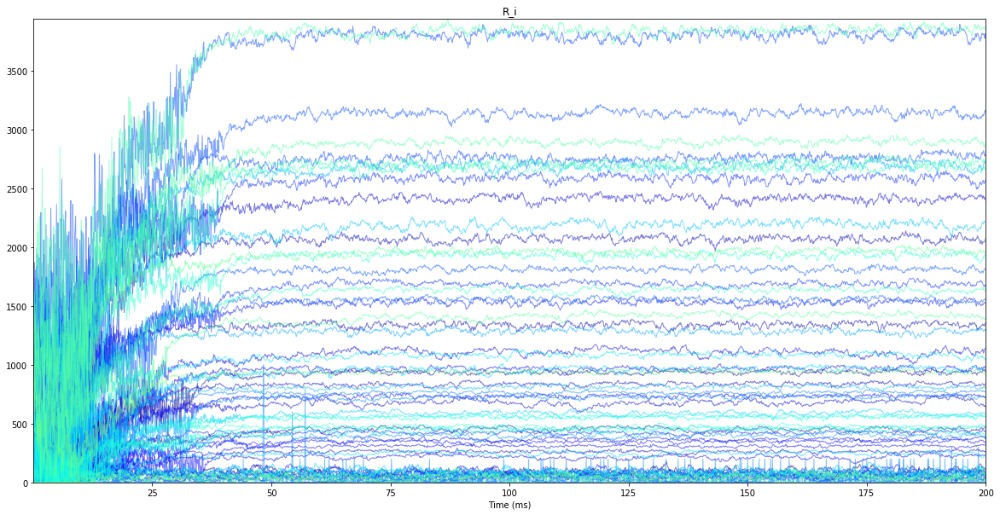

<Figure size 432x288 with 0 Axes>

In [16]:
# For timeseries plot:
plotter.plot_timeseries(S_e, title="Region S_e Time Series Raster", figsize=config.figures.NOTEBOOK_SIZE);
plotter.plot_timeseries(S_i, title="Region S_i Time Series Raster", figsize=config.figures.NOTEBOOK_SIZE);
plotter.plot_timeseries(R_e, title="Region R_e Time Series Raster", figsize=config.figures.NOTEBOOK_SIZE);
plotter.plot_timeseries(R_i, title="Region R_i Time Series Raster", figsize=config.figures.NOTEBOOK_SIZE);

2019-12-19 12:11:16,820 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:11:16,927 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:11:16,948 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:11:17,014 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:11:17,035 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:11:17,049 - DEBUG - matplotlib.axes._base - update_title_pos


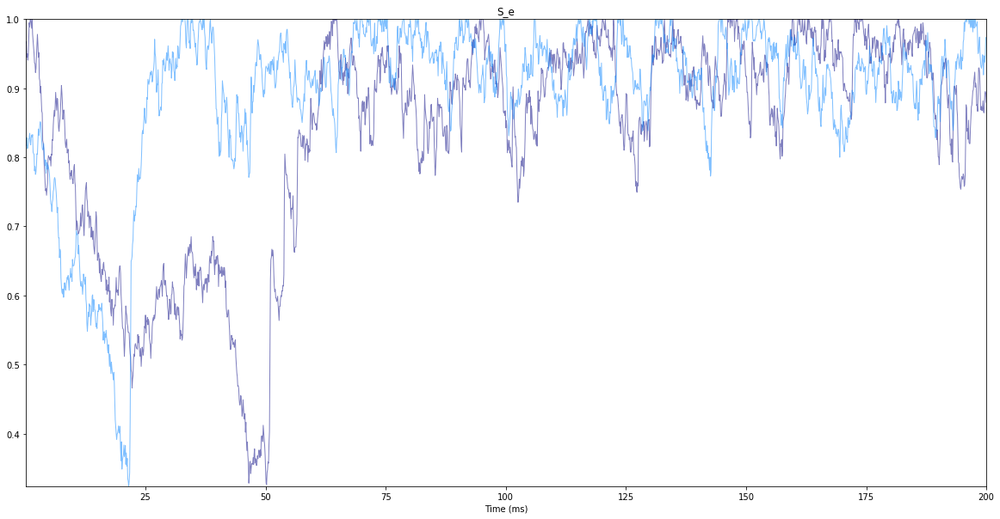

2019-12-19 12:11:17,137 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:11:17,246 - DEBUG - matplotlib.axes._base - update_title_pos


<Figure size 432x288 with 0 Axes>

2019-12-19 12:11:17,273 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:11:17,344 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:11:17,366 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:11:17,379 - DEBUG - matplotlib.axes._base - update_title_pos


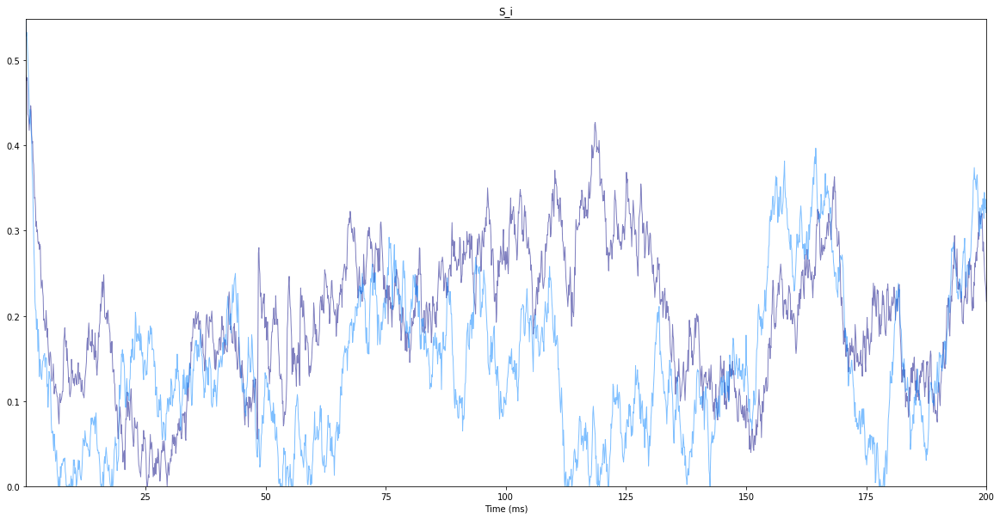

2019-12-19 12:11:17,468 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:11:17,573 - DEBUG - matplotlib.axes._base - update_title_pos


<Figure size 432x288 with 0 Axes>

2019-12-19 12:11:17,598 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:11:17,683 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:11:17,704 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:11:17,717 - DEBUG - matplotlib.axes._base - update_title_pos


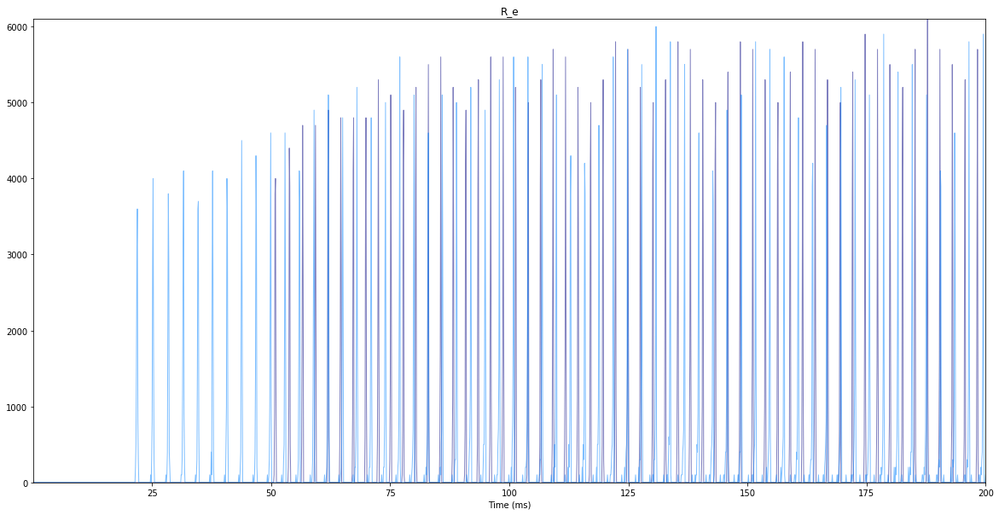

2019-12-19 12:11:17,816 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:11:17,904 - DEBUG - matplotlib.axes._base - update_title_pos


<Figure size 432x288 with 0 Axes>

2019-12-19 12:11:17,927 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:11:17,994 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:11:18,014 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:11:18,026 - DEBUG - matplotlib.axes._base - update_title_pos


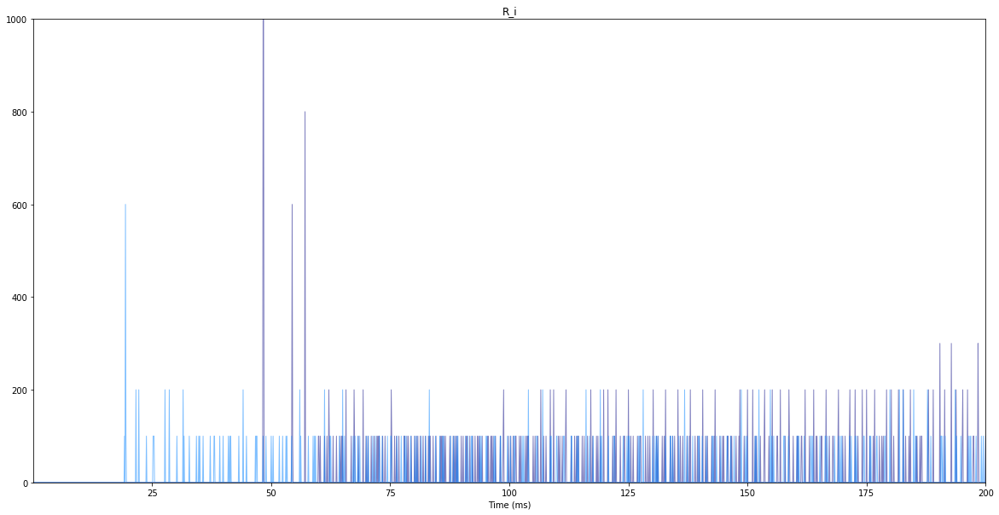

<Figure size 432x288 with 0 Axes>

In [17]:
# # For timeseries plot:
# plotter.plot_timeseries(S_e.get_subspace(tvb_nest_model.nest_nodes_ids), 
#                         title="Region S_e Time Series", 
#                         figsize=config.figures.NOTEBOOK_SIZE);
# plotter.plot_timeseries(S_i.get_subspace(tvb_nest_model.nest_nodes_ids), 
#                         title="Region S_i Time Series", 
#                         figsize=config.figures.NOTEBOOK_SIZE);
# plotter.plot_timeseries(R_e.get_subspace(tvb_nest_model.nest_nodes_ids), 
#                         title="Region R_e Time Series", 
#                         figsize=config.figures.NOTEBOOK_SIZE);
# plotter.plot_timeseries(R_i.get_subspace(tvb_nest_model.nest_nodes_ids), 
#                         title="Region R_i Time Series", 
#                         figsize=config.figures.NOTEBOOK_SIZE);

2019-12-19 12:18:39,478 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:18:39,584 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:18:39,606 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:18:39,713 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:18:39,735 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:18:39,748 - DEBUG - matplotlib.axes._base - update_title_pos


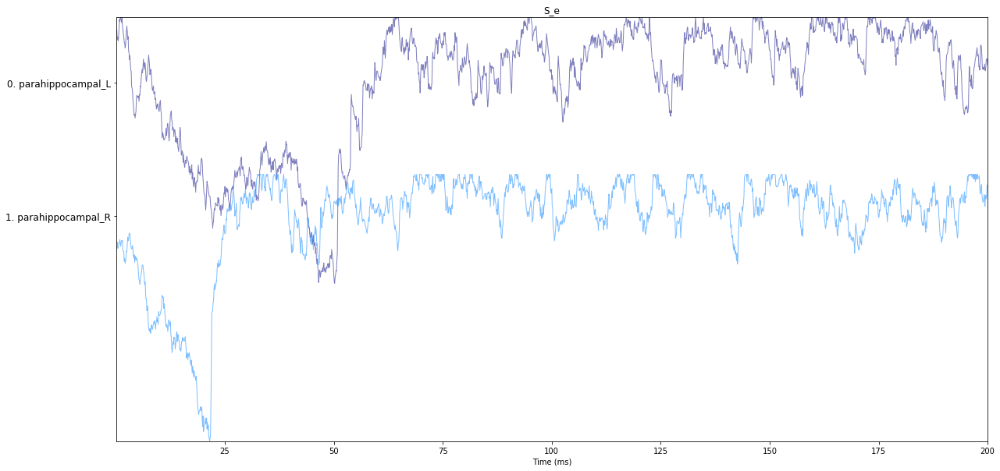

2019-12-19 12:18:39,861 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:18:39,967 - DEBUG - matplotlib.axes._base - update_title_pos


<Figure size 432x288 with 0 Axes>

2019-12-19 12:18:39,997 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:18:40,083 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:18:40,106 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:18:40,122 - DEBUG - matplotlib.axes._base - update_title_pos


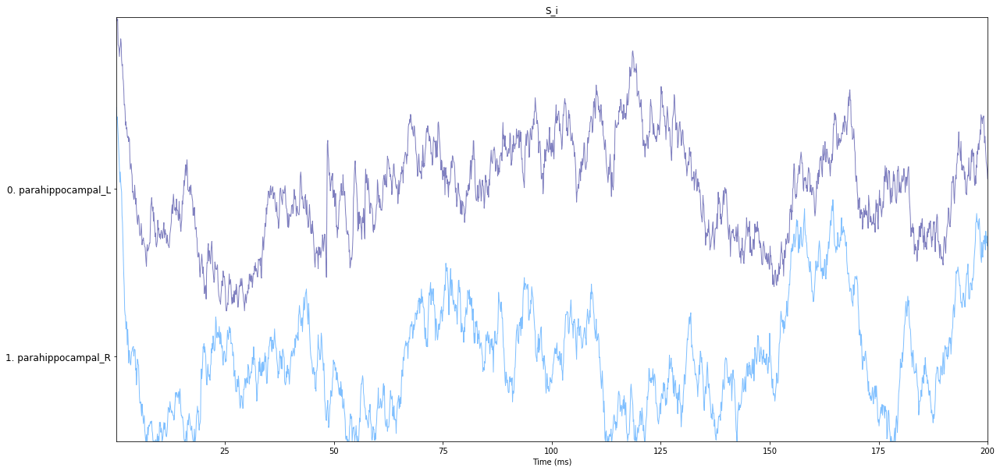

2019-12-19 12:18:40,235 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:18:40,353 - DEBUG - matplotlib.axes._base - update_title_pos


<Figure size 432x288 with 0 Axes>

2019-12-19 12:18:40,379 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:18:40,462 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:18:40,482 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:18:40,494 - DEBUG - matplotlib.axes._base - update_title_pos


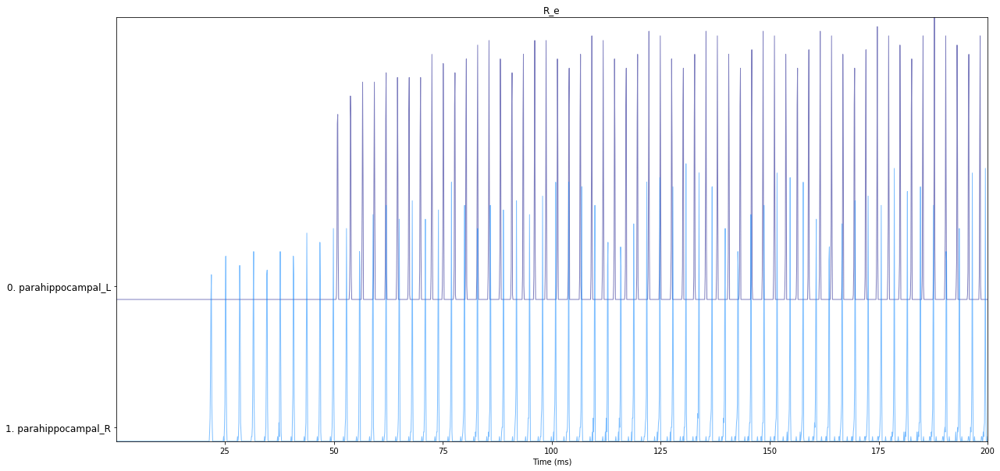

2019-12-19 12:18:40,623 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:18:40,720 - DEBUG - matplotlib.axes._base - update_title_pos


<Figure size 432x288 with 0 Axes>

2019-12-19 12:18:40,741 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:18:40,808 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:18:40,829 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:18:40,840 - DEBUG - matplotlib.axes._base - update_title_pos


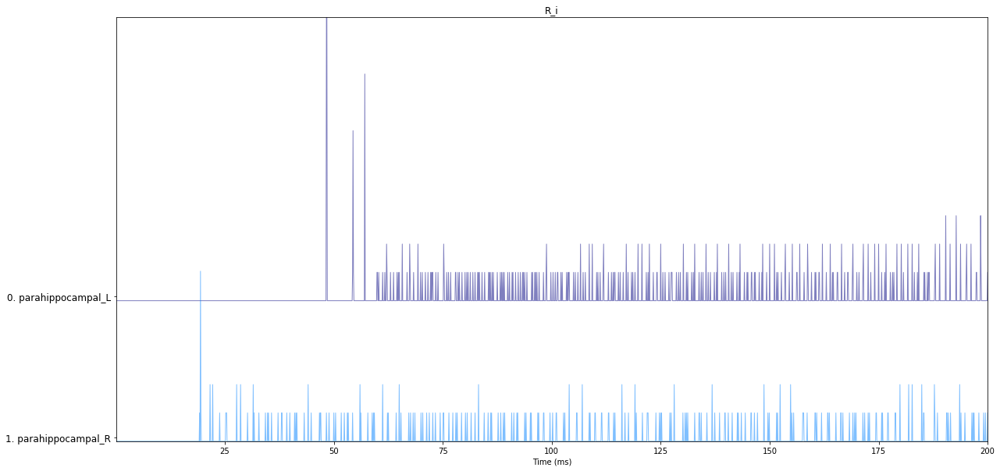

<Figure size 432x288 with 0 Axes>

In [30]:
# For raster plot:
plotter.plot_raster(S_e.get_subspace(tvb_nest_model.nest_nodes_ids), 
                    title="Region S_e Time Series Raster", 
                    figsize=config.figures.NOTEBOOK_SIZE);
plotter.plot_raster(S_i.get_subspace(tvb_nest_model.nest_nodes_ids), 
                    title="Region S_i Time Series Raster", 
                    figsize=config.figures.NOTEBOOK_SIZE);
plotter.plot_raster(R_e.get_subspace(tvb_nest_model.nest_nodes_ids), 
                    title="Region R_e Time Series Raster", 
                    figsize=config.figures.NOTEBOOK_SIZE);
plotter.plot_raster(R_i.get_subspace(tvb_nest_model.nest_nodes_ids), 
                        title="Region R_i Time Series Raster", 
                        figsize=config.figures.NOTEBOOK_SIZE);

### Interactive time series plot

In [ ]:
# # ...interactively as well
# # For interactive plotting:
# %matplotlib notebook 
# # Use this to skip completely the tvb-scripts plotter
# # from tvb.simulator.plot.timeseries_interactive import TimeSeriesInteractive
# # tvb_plotter = TimeSeriesInteractive(time_series=source_ts._tvb)
# # tvb_plotter.configure()
# # tvb_plotter.show()
# plotter.plot_timeseries_interactive(source_ts)

### Plot population mean membrane potential time series

In [20]:
%matplotlib inline 
# Plot NEST multimeter variables
multimeter_mean_data = tvb_nest_model.get_mean_data_from_NEST_multimeter_to_TVBTimeSeries()
# print(multimeter_mean_data)
# print(multimeter_mean_data.variables_labels)

2019-12-19 12:11:19,424 - DEBUG - matplotlib.pyplot - Loaded backend module://ipykernel.pylab.backend_inline version unknown.


In [21]:
# Substitute the per-region synaptic variables with their sums to reduce outputs:

s_AMPA_ext = multimeter_mean_data.get_state_variables_by_label(
            ['s_AMPA_ext_%d' % node_id for node_id in range(tvb_nest_model.number_of_nodes)], 
            title="Mean population s_AMPA_ext from NEST multimeter")
I_AMPA_ext = multimeter_mean_data.get_state_variables_by_label(
            ['I_AMPA_ext_%d' % node_id for node_id in range(tvb_nest_model.number_of_nodes)], 
            title="Mean population I_AMPA_ext from NEST multimeter")
spikes_exc_ext = multimeter_mean_data.get_state_variables_by_label(
                ['spikes_exc_ext_%d' % node_id for node_id in range(tvb_nest_model.number_of_nodes)], 
                title="Mean population spikes_exc_ext from NEST multimeter")
s_AMPA_ext_nest_nodes = s_AMPA_ext.get_state_variables_by_label(
                        ['s_AMPA_ext_%d' % node_id for node_id in tvb_nest_model.nest_nodes_ids], 
                        title="Mean population s_AMPA_ext_nest_nodes from NEST multimeter")
I_AMPA_ext_nest_nodes = I_AMPA_ext.get_state_variables_by_label(
                        ['I_AMPA_ext_%d' % node_id for node_id in tvb_nest_model.nest_nodes_ids], 
                        title="Mean population I_AMPA_ext_nest_nodes from NEST multimeter")
spikes_exc_ext_nest_nodes = spikes_exc_ext.get_state_variables_by_label(
                            ['spikes_exc_ext_%d' % node_id for node_id in tvb_nest_model.nest_nodes_ids], 
                            title="Mean population spikes_exc_ext_nest_nodes from NEST multimeter")

from tvb_scripts.time_series.service import TimeSeriesService
ts_service = TimeSeriesService()
s_AMPA_ext_tot = ts_service.sum_across_dimension(s_AMPA_ext, 1, 
                                                 title="Mean population s_AMPA_ext_tot from NEST multimeter")
s_AMPA_ext_tot.labels_dimensions["Variable"] = ["s_AMPA_ext_tot"]
I_AMPA_ext_tot = ts_service.sum_across_dimension(I_AMPA_ext, 1, 
                                                 title="Mean population I_AMPA_ext_tot from NEST multimeter")
I_AMPA_ext_tot.labels_dimensions["Variable"] = ["I_AMPA_ext_tot"]
spikes_exc_ext_tot = ts_service.sum_across_dimension(spikes_exc_ext, 1, 
                                                     title="Mean population spikes_exc_ext_tot from NEST multimeter")
spikes_exc_ext_tot.labels_dimensions["Variable"] = ["spikes_exc_ext_tot"]

multimeter_mean_data_ext = \
    ts_service.concatenate_variables([spikes_exc_ext_tot, s_AMPA_ext_tot, I_AMPA_ext_tot, 
                                      spikes_exc_ext_nest_nodes, s_AMPA_ext_nest_nodes, I_AMPA_ext_nest_nodes])

multimeter_mean_data_exc = multimeter_mean_data.get_state_variables_by_label(
            ['spikes_exc', 's_AMPA', 'I_AMPA', 'x_NMDA', 's_NMDA', 'I_NMDA'], 
            title="Mean exciatory synapse data from NEST multimeter")
    
multimeter_mean_data_inh = multimeter_mean_data.get_state_variables_by_label(
            ['spikes_inh', 's_GABA', 'I_GABA'], 
           title="Mean inhibitory synapse data from NEST multimeter")
    
multimeter_mean_data_neuron = multimeter_mean_data.get_state_variables_by_label(
            ['V_m', 'I_L', 'I_e'], 
            title="Mean external synapse data from NEST multimeter")

In [22]:
# for data, label in zip([multimeter_mean_data_neuron, multimeter_mean_data_exc,
#                         multimeter_mean_data_inh, multimeter_mean_data_ext], 
#                        ["", " Excitatory synapses ", " Inhibitory synapses ", " External synapses "]):
#     plotter.plot_multimeter_raster(data, plot_per_variable=True,
#                                    time_series_class=TimeSeriesRegion, 
#                                    time_series_args={}, var_pop_join_str=" - ", 
#                                    default_population_label="population",
#                                    title="NEST region %stime series raster" % label)

2019-12-19 12:12:35,244 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:12:35,278 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:12:35,410 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:12:35,431 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:12:35,454 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:12:35,472 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:12:35,561 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:12:35,590 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:12:35,626 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:12:35,649 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:12:35,663 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:12:35,691 - DEBUG - matplotlib.axes._base - update_title_pos


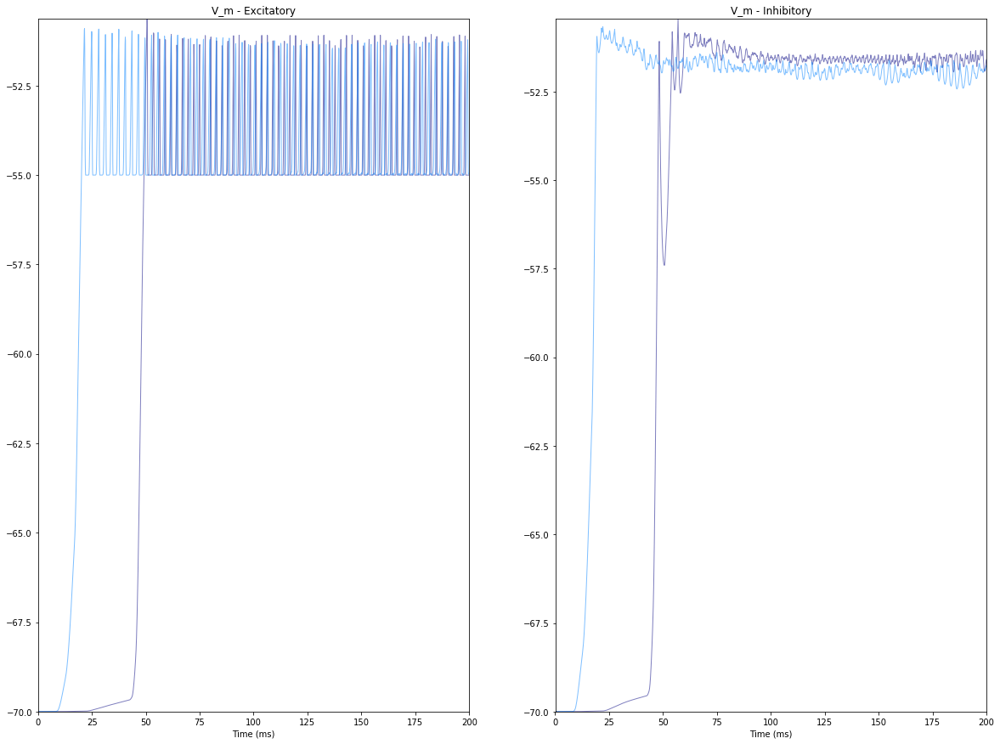

2019-12-19 12:12:35,795 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:12:35,822 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:12:35,935 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:12:35,952 - DEBUG - matplotlib.axes._base - update_title_pos


<Figure size 432x288 with 0 Axes>

2019-12-19 12:12:35,977 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:12:35,996 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:12:36,086 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:12:36,101 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:12:36,128 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:12:36,142 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:12:36,156 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:12:36,183 - DEBUG - matplotlib.axes._base - update_title_pos


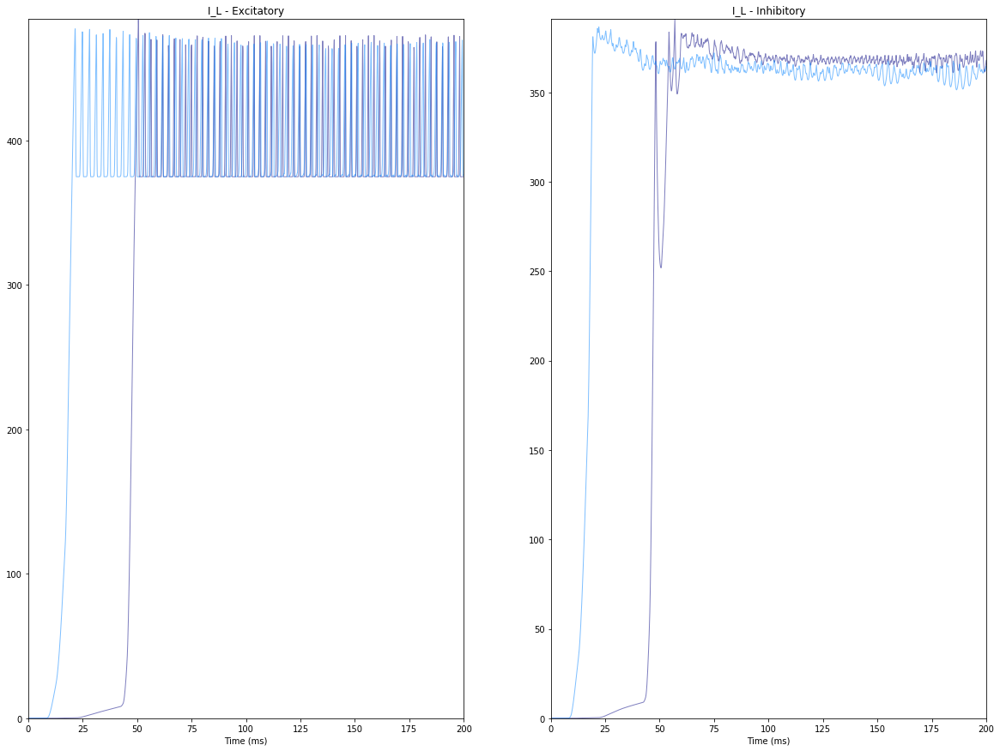

2019-12-19 12:12:36,286 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:12:36,320 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:12:36,417 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:12:36,433 - DEBUG - matplotlib.axes._base - update_title_pos


<Figure size 432x288 with 0 Axes>

2019-12-19 12:12:36,452 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:12:36,471 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:12:36,561 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:12:36,575 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:12:36,603 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:12:36,617 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:12:36,631 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:12:36,652 - DEBUG - matplotlib.axes._base - update_title_pos


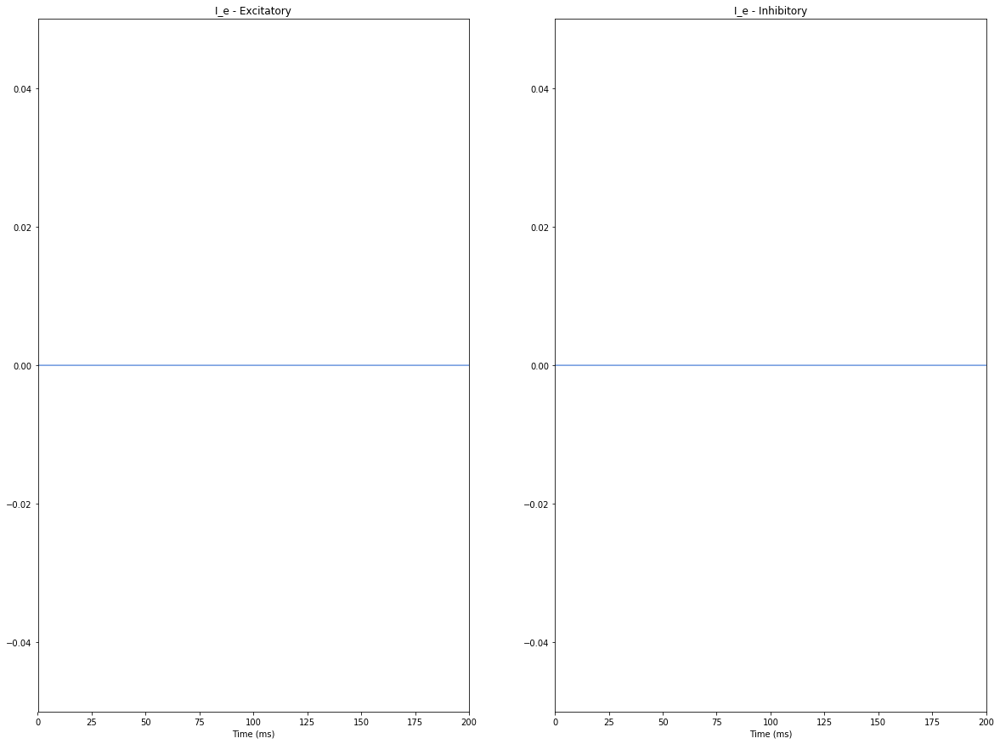

2019-12-19 12:12:36,747 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:12:36,777 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:12:36,881 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:12:36,900 - DEBUG - matplotlib.axes._base - update_title_pos


<Figure size 432x288 with 0 Axes>

2019-12-19 12:12:36,925 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:12:36,943 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:12:37,026 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:12:37,041 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:12:37,067 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:12:37,080 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:12:37,095 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:12:37,122 - DEBUG - matplotlib.axes._base - update_title_pos


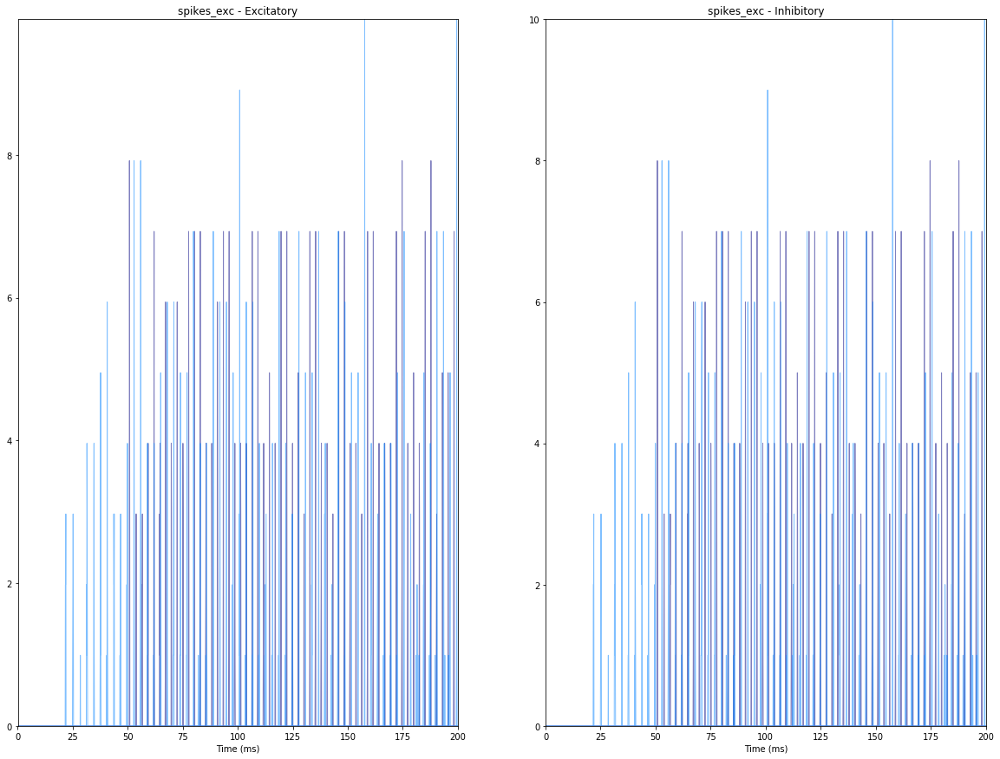

2019-12-19 12:12:37,312 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:12:37,366 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:12:37,556 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:12:37,581 - DEBUG - matplotlib.axes._base - update_title_pos


<Figure size 432x288 with 0 Axes>

2019-12-19 12:12:37,610 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:12:37,633 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:12:37,775 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:12:37,790 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:12:37,818 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:12:37,837 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:12:37,850 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:12:37,874 - DEBUG - matplotlib.axes._base - update_title_pos


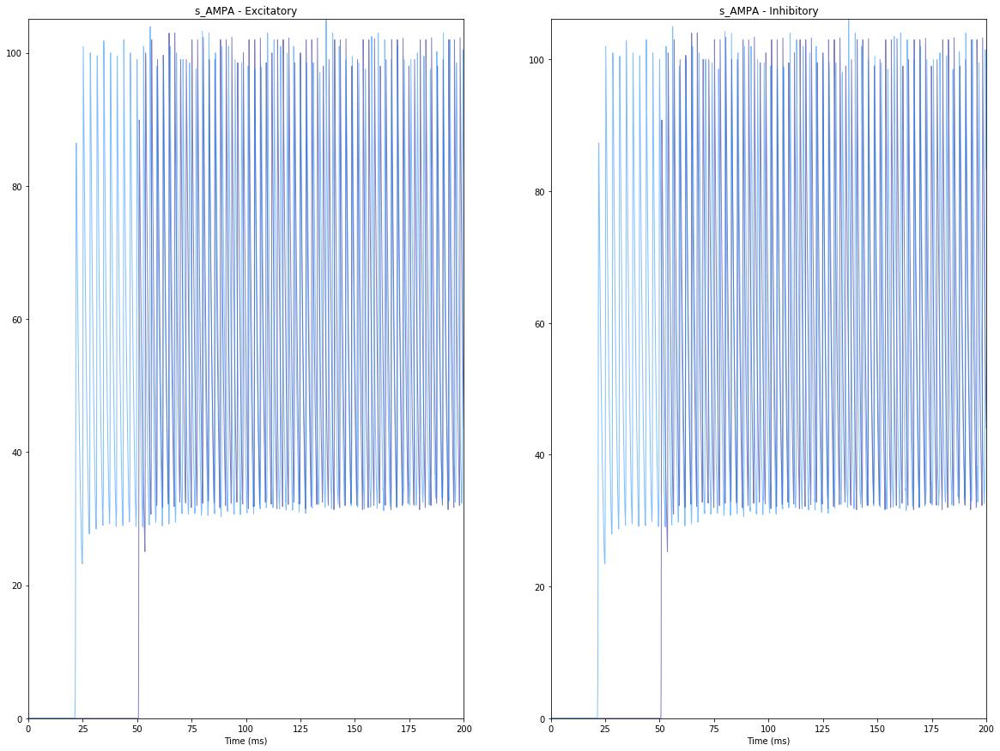

2019-12-19 12:12:38,036 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:12:38,072 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:12:38,260 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:12:38,283 - DEBUG - matplotlib.axes._base - update_title_pos


<Figure size 432x288 with 0 Axes>

2019-12-19 12:12:38,314 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:12:38,340 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:12:38,496 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:12:38,509 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:12:38,537 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:12:38,552 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:12:38,565 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:12:38,599 - DEBUG - matplotlib.axes._base - update_title_pos


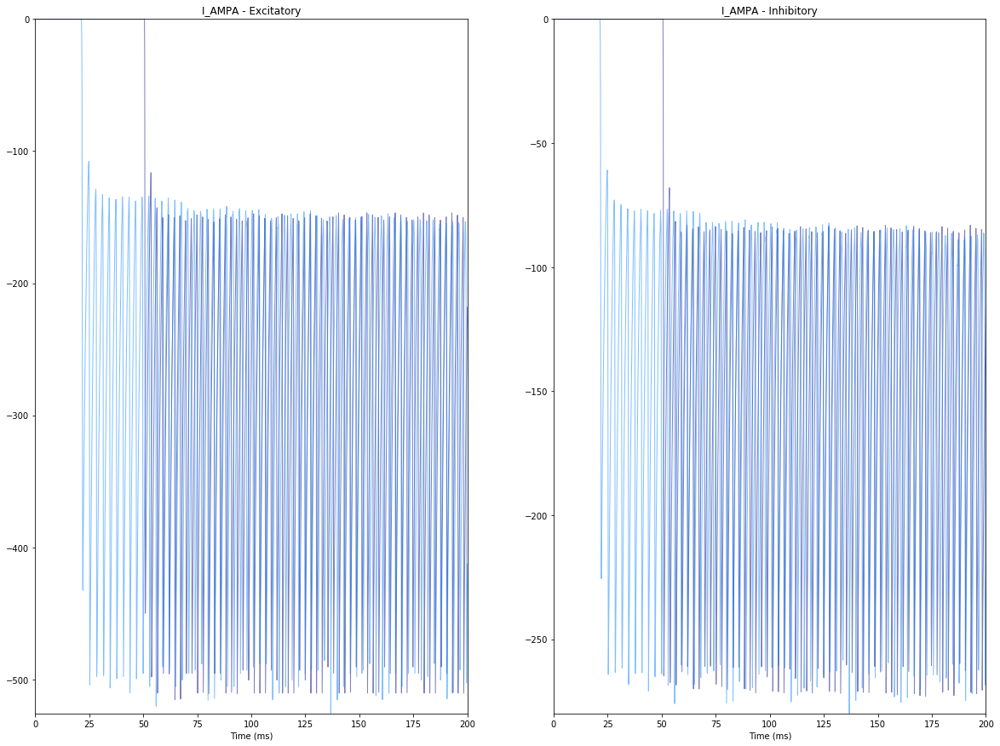

2019-12-19 12:12:38,764 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:12:38,797 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:12:38,980 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:12:39,003 - DEBUG - matplotlib.axes._base - update_title_pos


<Figure size 432x288 with 0 Axes>

2019-12-19 12:12:39,032 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:12:39,057 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:12:39,206 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:12:39,221 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:12:39,250 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:12:39,265 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:12:39,278 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:12:39,306 - DEBUG - matplotlib.axes._base - update_title_pos


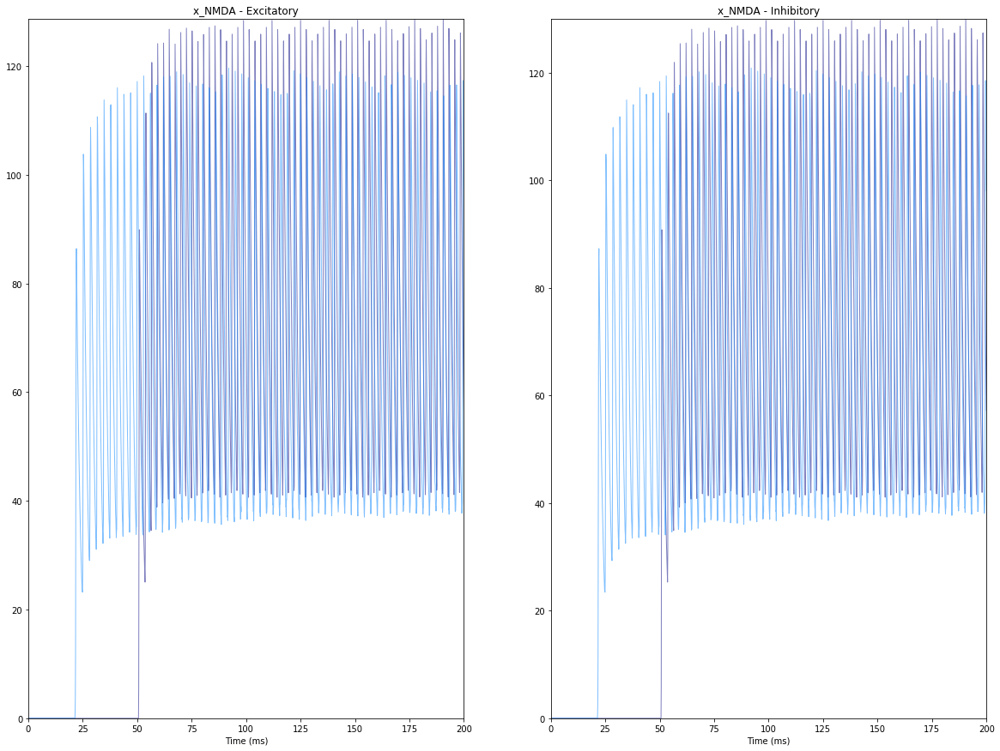

2019-12-19 12:12:39,495 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:12:39,521 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:12:39,607 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:12:39,624 - DEBUG - matplotlib.axes._base - update_title_pos


<Figure size 432x288 with 0 Axes>

2019-12-19 12:12:39,645 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:12:39,663 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:12:39,738 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:12:39,753 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:12:39,782 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:12:39,796 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:12:39,810 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:12:39,830 - DEBUG - matplotlib.axes._base - update_title_pos


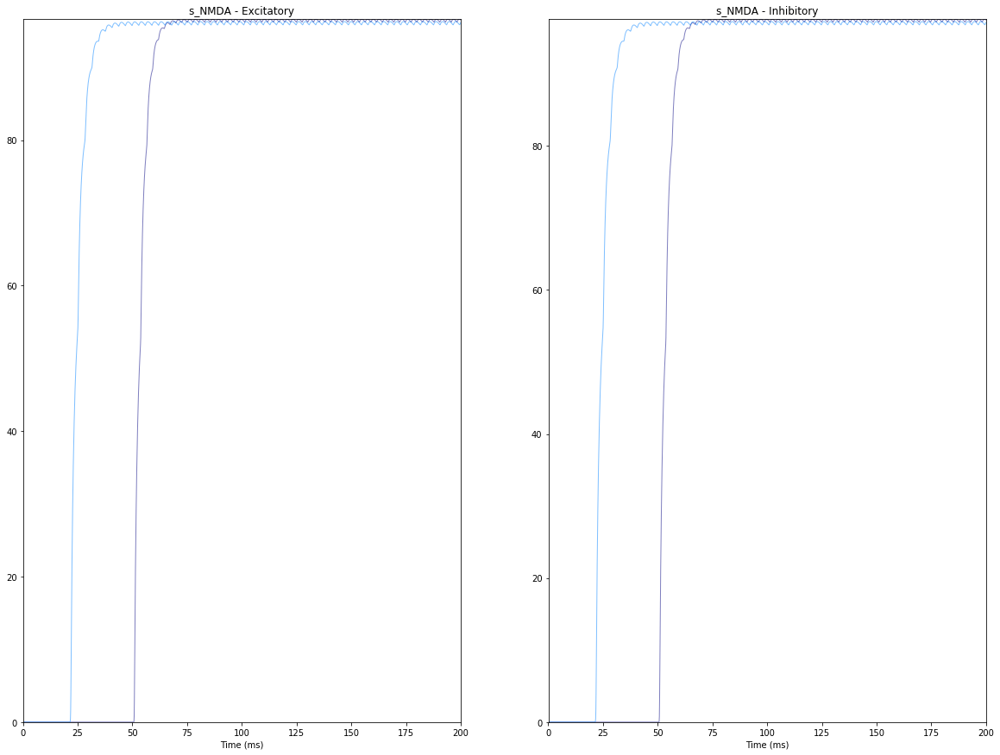

2019-12-19 12:12:39,928 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:12:39,957 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:12:40,064 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:12:40,081 - DEBUG - matplotlib.axes._base - update_title_pos


<Figure size 432x288 with 0 Axes>

2019-12-19 12:12:40,102 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:12:40,119 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:12:40,200 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:12:40,215 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:12:40,241 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:12:40,255 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:12:40,268 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:12:40,289 - DEBUG - matplotlib.axes._base - update_title_pos


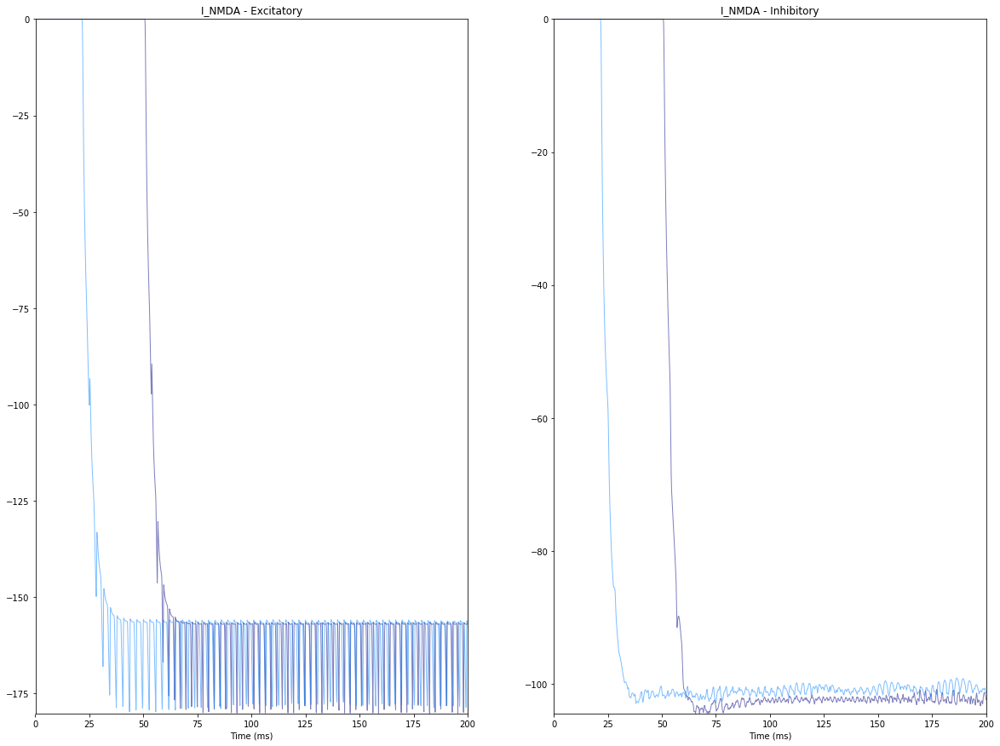

2019-12-19 12:12:40,423 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:12:40,470 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:12:40,566 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:12:40,585 - DEBUG - matplotlib.axes._base - update_title_pos


<Figure size 432x288 with 0 Axes>

2019-12-19 12:12:40,610 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:12:40,627 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:12:40,705 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:12:40,721 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:12:40,748 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:12:40,763 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:12:40,778 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:12:40,801 - DEBUG - matplotlib.axes._base - update_title_pos


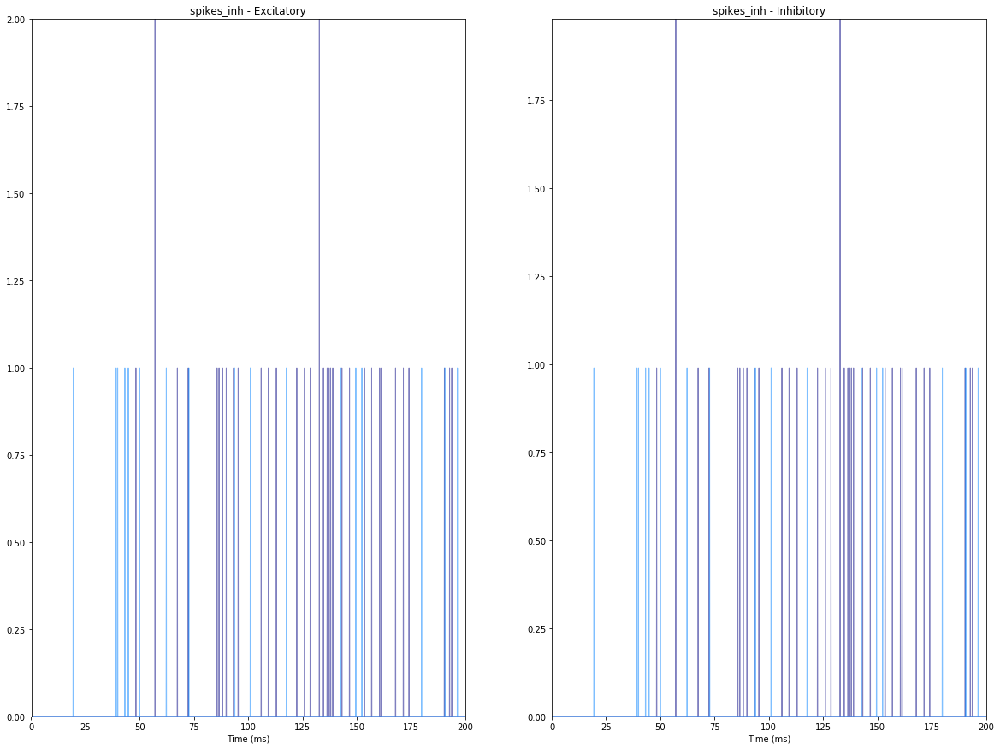

2019-12-19 12:12:40,885 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:12:40,913 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:12:41,030 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:12:41,047 - DEBUG - matplotlib.axes._base - update_title_pos


<Figure size 432x288 with 0 Axes>

2019-12-19 12:12:41,070 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:12:41,087 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:12:41,180 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:12:41,195 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:12:41,221 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:12:41,235 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:12:41,249 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:12:41,271 - DEBUG - matplotlib.axes._base - update_title_pos


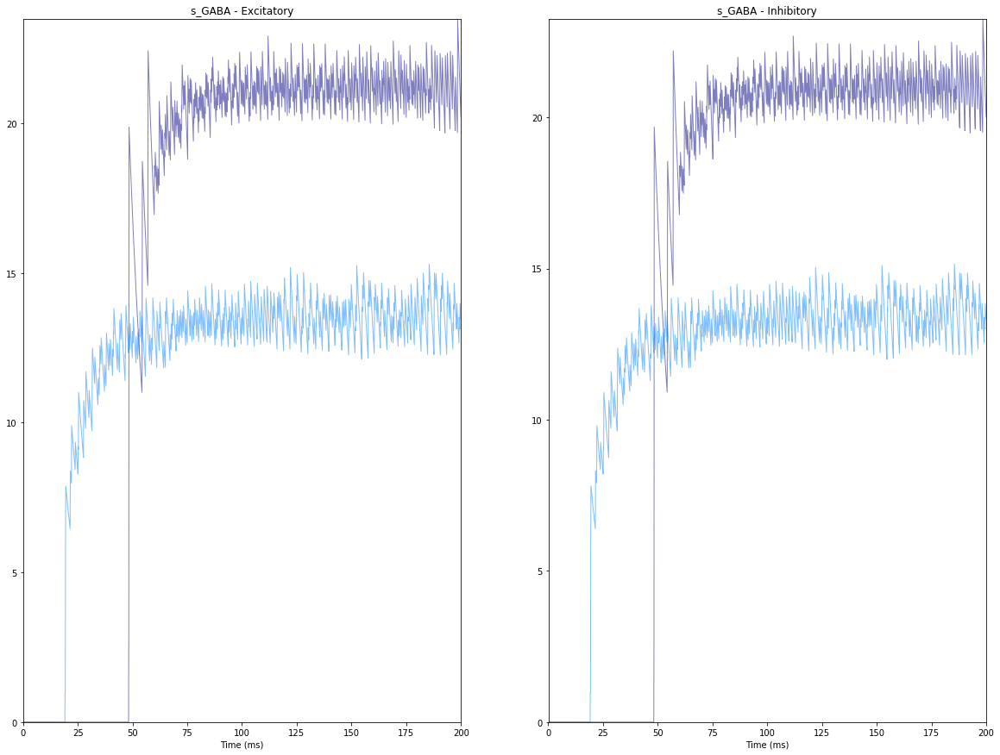

2019-12-19 12:12:41,369 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:12:41,398 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:12:41,523 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:12:41,542 - DEBUG - matplotlib.axes._base - update_title_pos


<Figure size 432x288 with 0 Axes>

2019-12-19 12:12:41,566 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:12:41,584 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:12:41,679 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:12:41,693 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:12:41,722 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:12:41,735 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:12:41,752 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:12:41,772 - DEBUG - matplotlib.axes._base - update_title_pos


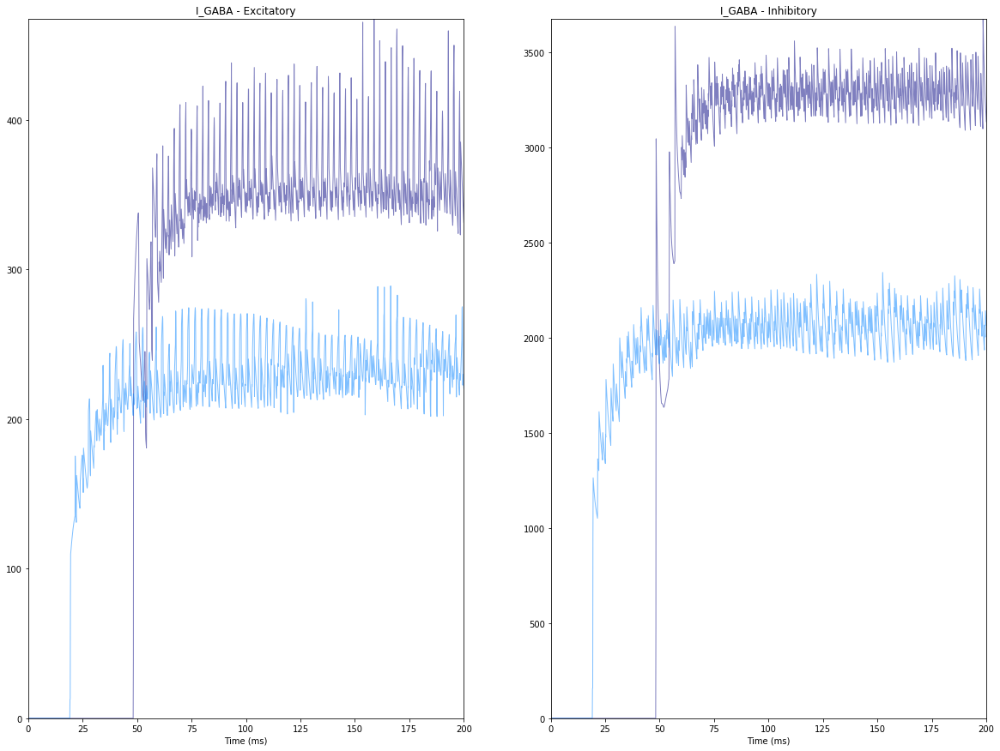

2019-12-19 12:12:41,891 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:12:41,940 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:12:42,049 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:12:42,069 - DEBUG - matplotlib.axes._base - update_title_pos


<Figure size 432x288 with 0 Axes>

2019-12-19 12:12:42,102 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:12:42,123 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:12:42,208 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:12:42,222 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:12:42,251 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:12:42,267 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:12:42,281 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:12:42,304 - DEBUG - matplotlib.axes._base - update_title_pos


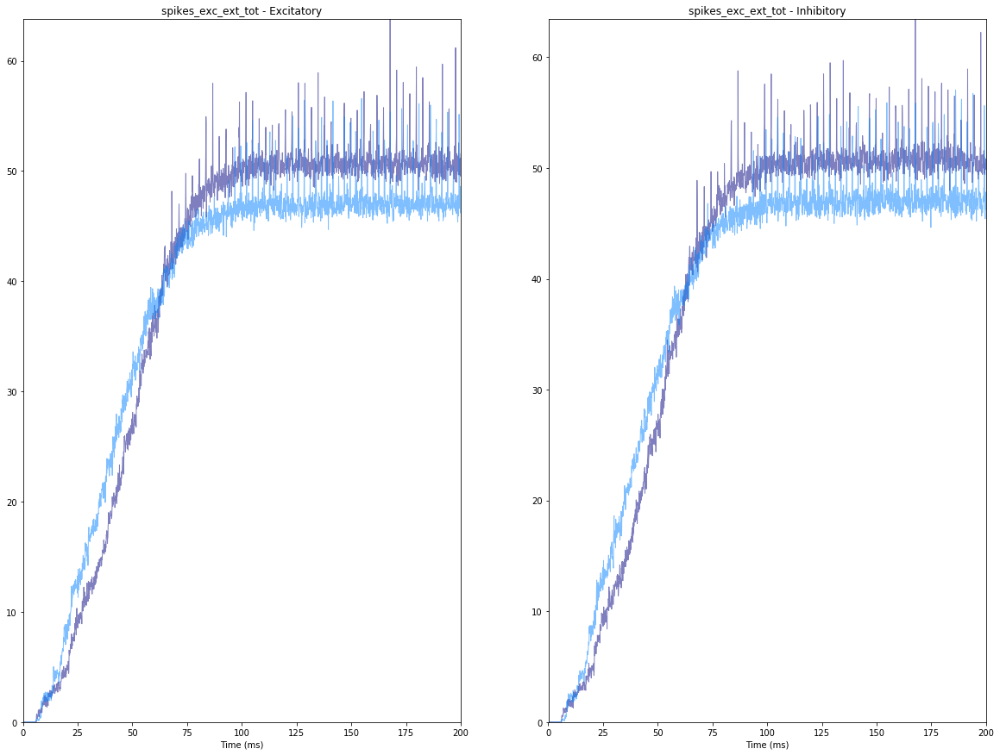

2019-12-19 12:12:42,400 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:12:42,426 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:12:42,525 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:12:42,542 - DEBUG - matplotlib.axes._base - update_title_pos


<Figure size 432x288 with 0 Axes>

2019-12-19 12:12:42,564 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:12:42,581 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:12:42,665 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:12:42,679 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:12:42,707 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:12:42,721 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:12:42,735 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:12:42,755 - DEBUG - matplotlib.axes._base - update_title_pos


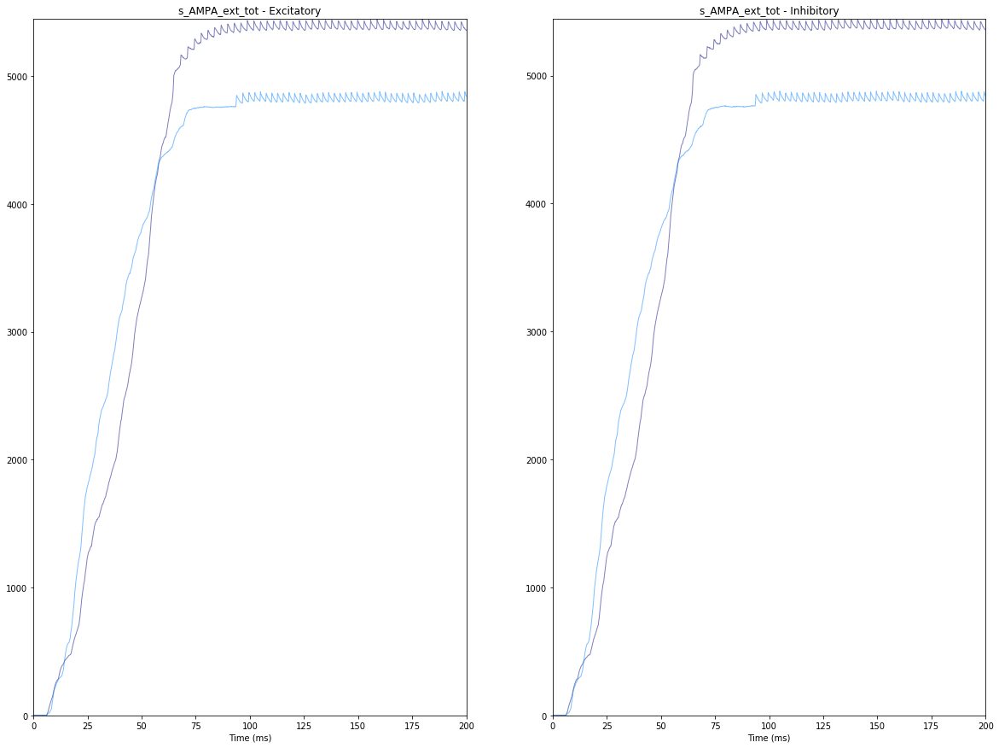

2019-12-19 12:12:42,841 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:12:42,870 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:12:42,979 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:12:42,997 - DEBUG - matplotlib.axes._base - update_title_pos


<Figure size 432x288 with 0 Axes>

2019-12-19 12:12:43,022 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:12:43,041 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:12:43,124 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:12:43,145 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:12:43,183 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:12:43,198 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:12:43,214 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:12:43,234 - DEBUG - matplotlib.axes._base - update_title_pos


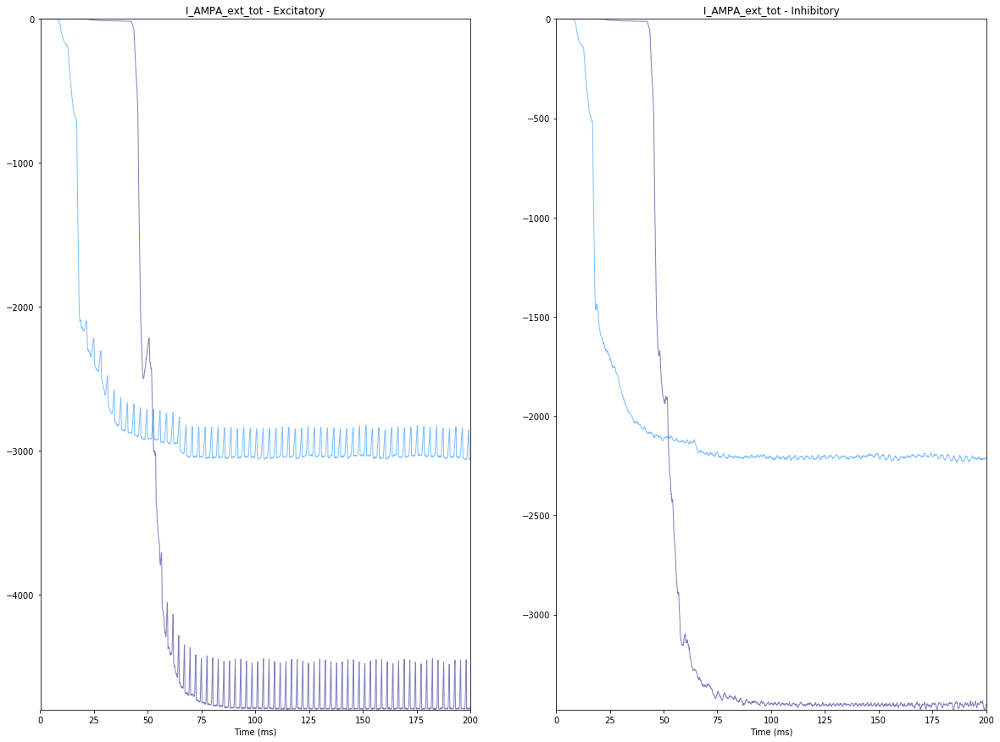

2019-12-19 12:12:43,332 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:12:43,373 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:12:43,491 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:12:43,511 - DEBUG - matplotlib.axes._base - update_title_pos


<Figure size 432x288 with 0 Axes>

2019-12-19 12:12:43,542 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:12:43,562 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:12:43,662 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:12:43,678 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:12:43,711 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:12:43,734 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:12:43,752 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:12:43,778 - DEBUG - matplotlib.axes._base - update_title_pos


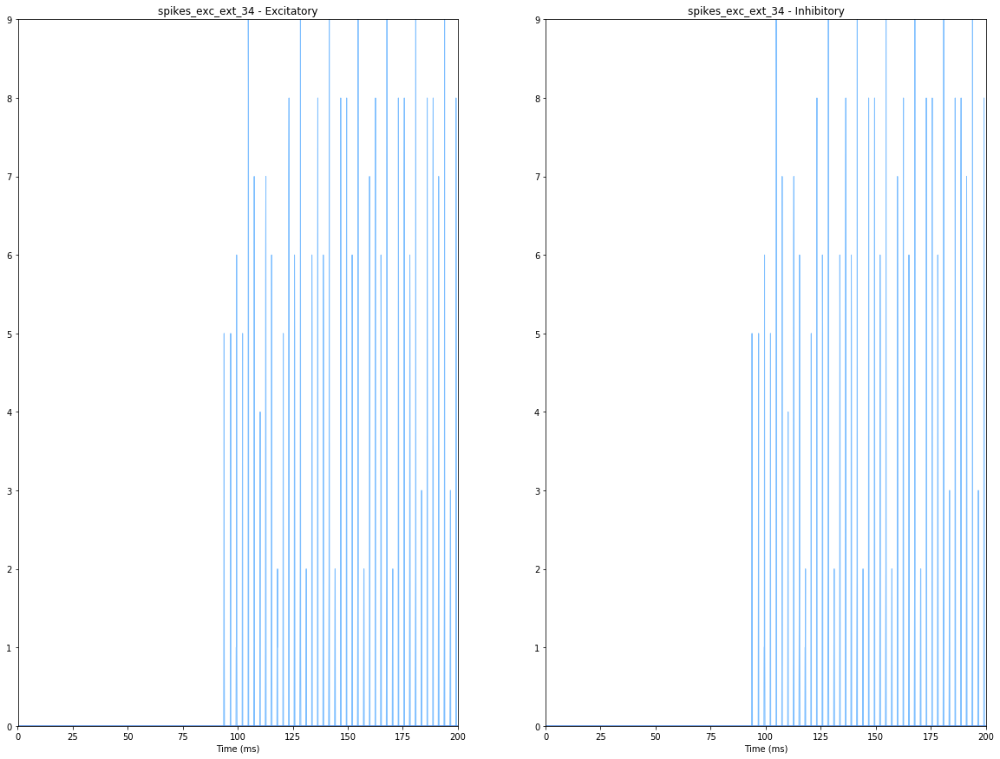

2019-12-19 12:12:43,943 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:12:43,977 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:12:44,074 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:12:44,092 - DEBUG - matplotlib.axes._base - update_title_pos


<Figure size 432x288 with 0 Axes>

2019-12-19 12:12:44,117 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:12:44,134 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:12:44,215 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:12:44,230 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:12:44,259 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:12:44,277 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:12:44,292 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:12:44,313 - DEBUG - matplotlib.axes._base - update_title_pos


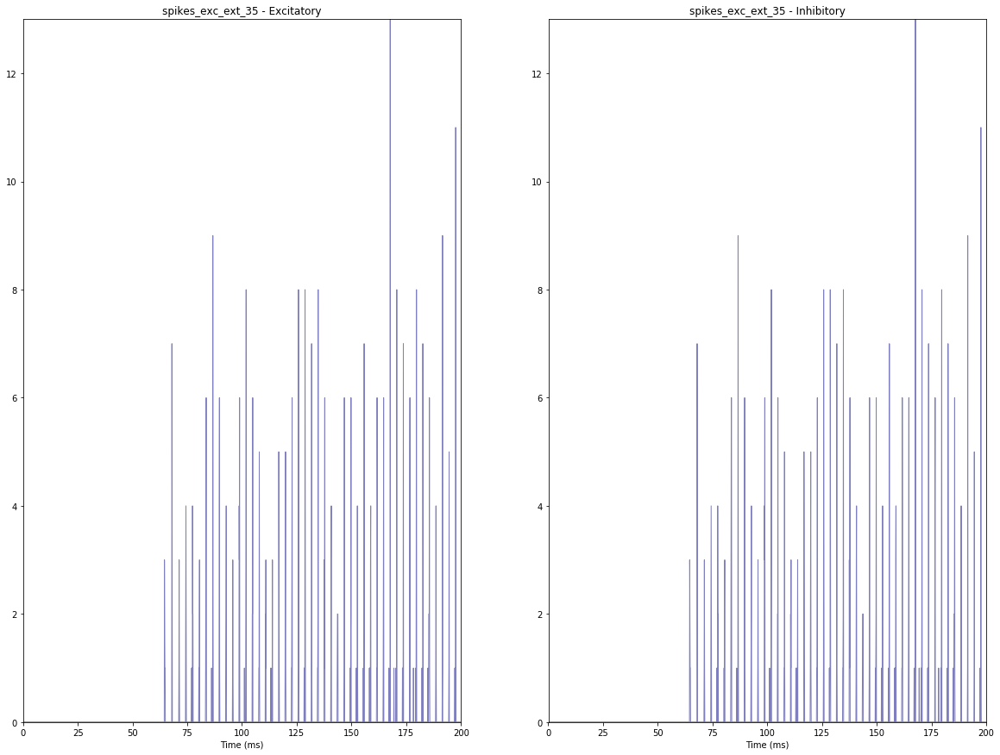

2019-12-19 12:12:44,399 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:12:44,430 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:12:44,541 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:12:44,560 - DEBUG - matplotlib.axes._base - update_title_pos


<Figure size 432x288 with 0 Axes>

2019-12-19 12:12:44,584 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:12:44,603 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:12:44,699 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:12:44,715 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:12:44,743 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:12:44,757 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:12:44,772 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:12:44,795 - DEBUG - matplotlib.axes._base - update_title_pos


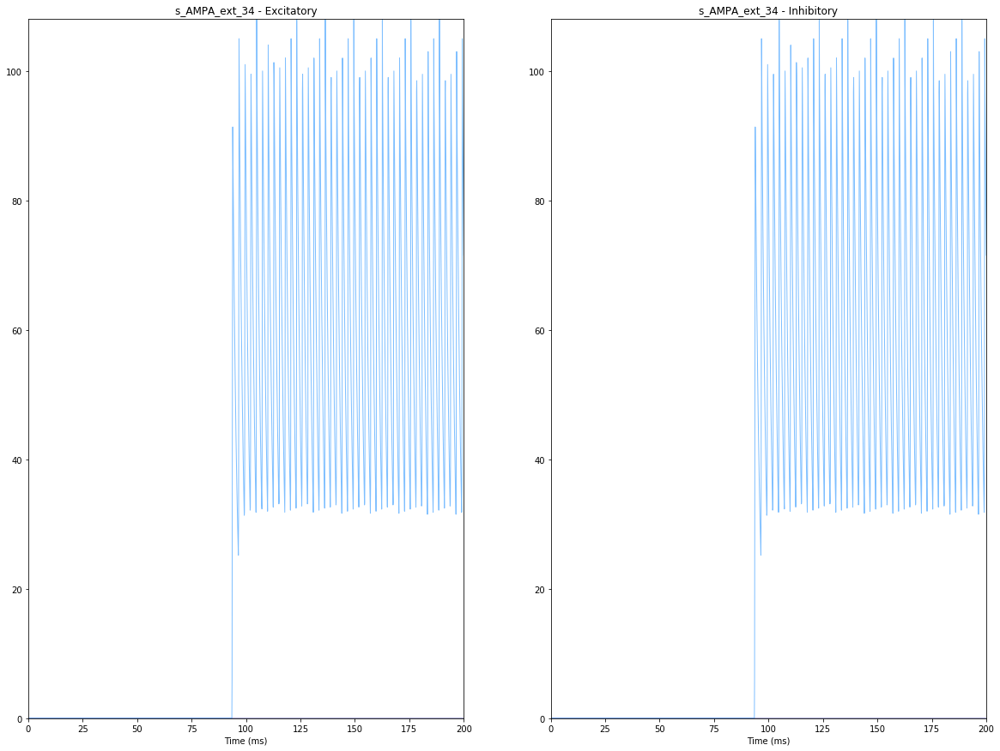

2019-12-19 12:12:44,898 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:12:44,929 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:12:45,043 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:12:45,062 - DEBUG - matplotlib.axes._base - update_title_pos


<Figure size 432x288 with 0 Axes>

2019-12-19 12:12:45,086 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:12:45,105 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:12:45,203 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:12:45,218 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:12:45,246 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:12:45,260 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:12:45,274 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:12:45,309 - DEBUG - matplotlib.axes._base - update_title_pos


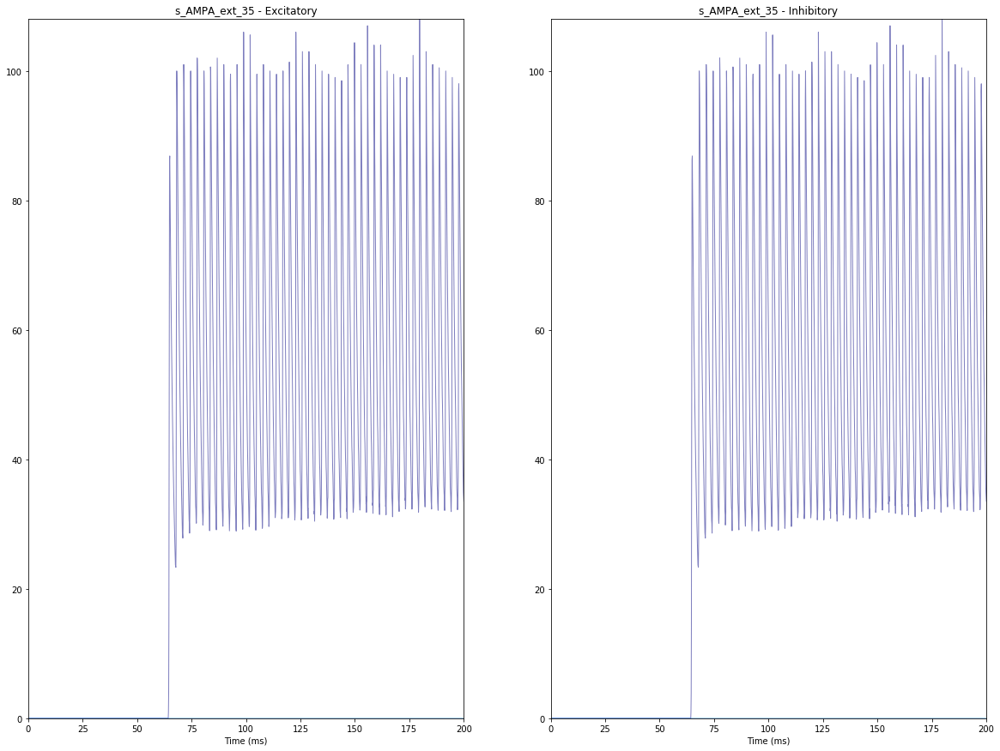

2019-12-19 12:12:45,422 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:12:45,456 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:12:45,570 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:12:45,590 - DEBUG - matplotlib.axes._base - update_title_pos


<Figure size 432x288 with 0 Axes>

2019-12-19 12:12:45,614 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:12:45,633 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:12:45,728 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:12:45,744 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:12:45,774 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:12:45,789 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:12:45,803 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:12:45,829 - DEBUG - matplotlib.axes._base - update_title_pos


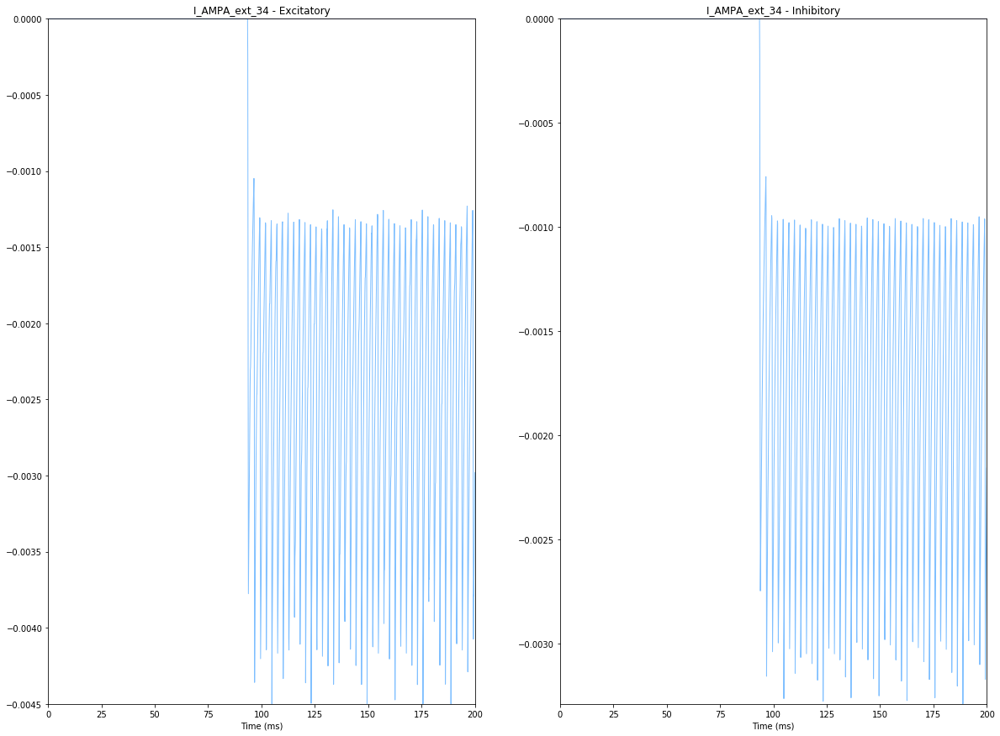

2019-12-19 12:12:45,943 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:12:45,973 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:12:46,096 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:12:46,115 - DEBUG - matplotlib.axes._base - update_title_pos


<Figure size 432x288 with 0 Axes>

2019-12-19 12:12:46,108 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:12:46,126 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:12:46,228 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:12:46,245 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:12:46,275 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:12:46,291 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:12:46,307 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:12:46,331 - DEBUG - matplotlib.axes._base - update_title_pos


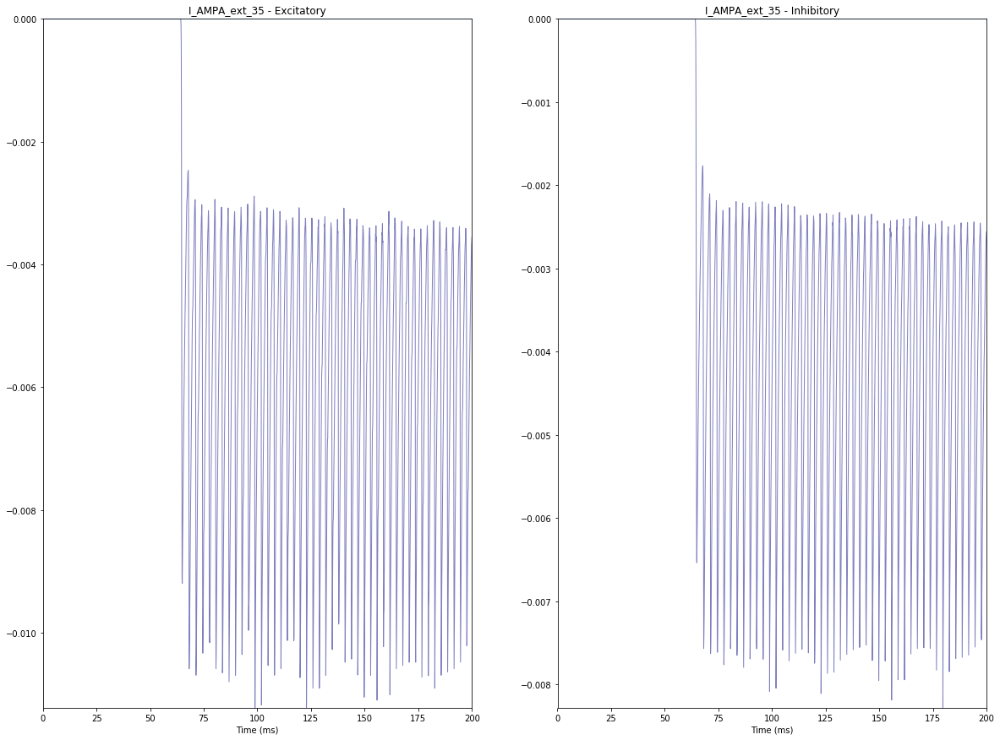

<Figure size 432x288 with 0 Axes>

In [23]:
for data, label in zip([multimeter_mean_data_neuron, multimeter_mean_data_exc,
                        multimeter_mean_data_inh, multimeter_mean_data_ext], 
                       ["", " Excitatory synapses ", " Inhibitory synapses ", " External synapses "]):    
    plotter.plot_multimeter_timeseries(data, plot_per_variable=True,
                                       time_series_class=TimeSeriesRegion, 
                                       time_series_args={}, var_pop_join_str=" - ", 
                                       default_population_label="population",
                                       title="NEST region %stime series" % label)

### Plot spikes' raster and mean spike rate for NEST regions

2019-12-19 12:12:46,854 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:12:46,873 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:12:46,895 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:12:46,906 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:12:47,003 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:12:47,020 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:12:47,040 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:12:47,051 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:12:47,066 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:12:47,086 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:12:47,106 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:12:47,116 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:12:47,193 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:12:47,204 -

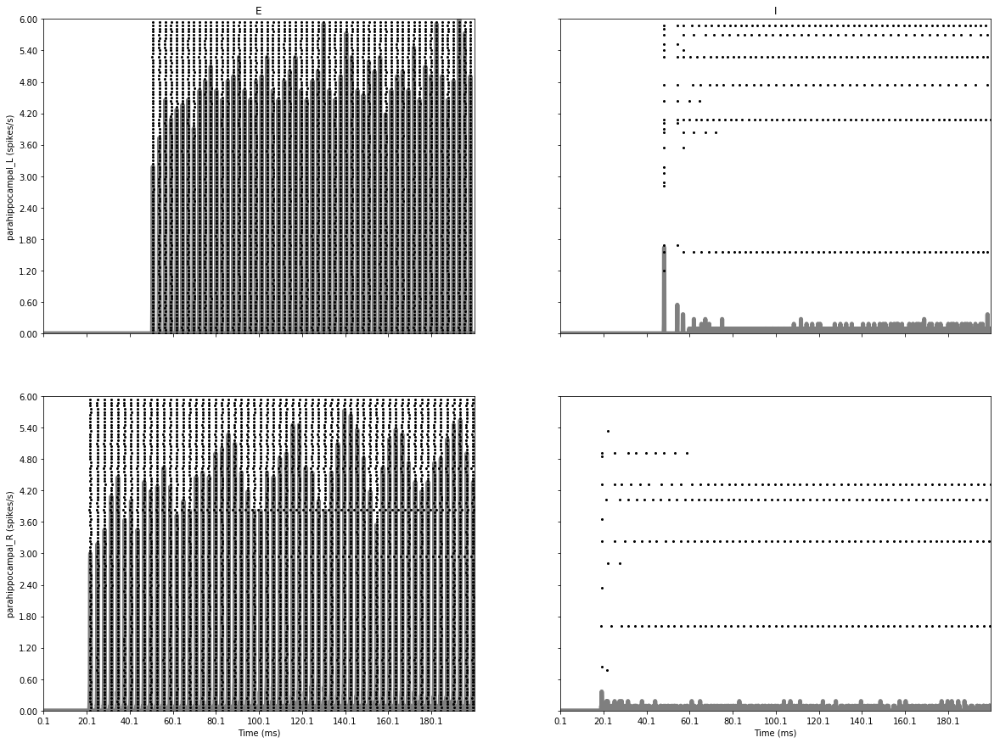

<Figure size 432x288 with 0 Axes>

In [24]:
# Plot spikes and mean field spike rates
rates, spike_detectors = \
    tvb_nest_model.get_mean_spikes_rates_from_NEST_to_TVBTimeSeries(
        spikes_kernel_width= simulator.integrator.dt,  # ms
        spikes_kernel_overlap=0.0, time=t)
if spike_detectors is not None:
    plotter.plot_spikes(spike_detectors, rates=rates, title='Population spikes and mean spike rate')

### Plotting NEST network activity using xarray

In [25]:
from tvb_scripts.time_series.time_series_xarray import TimeSeries as TimeSeriesXarray
import xarray as xr

multimeter_mean_data = nest_network.get_mean_data_from_multimeter()
ts = TimeSeriesXarray(multimeter_mean_data)
print(ts)

ts_exc = ts[:, ["spikes_exc", "s_AMPA", "I_AMPA", "x_NMDA", "s_NMDA", "I_NMDA"]]
ts_exc._data.name = "Mean excitatory synapse data from NEST multimeter"
print(ts_exc)
ts_inh = ts[:, ["spikes_inh", "s_GABA", "I_GABA"]]
ts_inh._data.name = "Mean inhibitory synapse data from NEST multimeter"

# Substitute the per-region synaptic variables with their sums to reduce outputs:
s_AMPA_ext_nest_nodes = ts[:, ['s_AMPA_ext_%d' % node_id for node_id in nest_nodes_ids] ]._data
I_AMPA_ext_nest_nodes = ts[:, ['I_AMPA_ext_%d' % node_id for node_id in nest_nodes_ids] ]._data
spikes_exc_ext_nest_nodes = ts[:, ['spikes_exc_ext_%d' % node_id for node_id in nest_nodes_ids] ]._data

s_AMPA_ext_tot = \
    ts[:, ['s_AMPA_ext_%d' % node_id for node_id in range(nest_network.number_of_nodes)] ].\
    _data.sum(axis=1).expand_dims(axis=1, dim={"Variable": ["s_AMPA_ext_tot"]})
I_AMPA_ext_tot = \
    ts[:, ['I_AMPA_ext_%d' % node_id for node_id in range(nest_network.number_of_nodes)] ].\
    _data.sum(axis=1).expand_dims(axis=1, dim={"Variable": ["I_AMPA_ext_tot"]})
spikes_exc_ext_tot = \
    ts[:, ['spikes_exc_ext_%d' % node_id for node_id in range(nest_network.number_of_nodes)] ].\
    _data.sum(axis=1).expand_dims(axis=1, dim={"Variable": ["spikes_exc_ext_tot"]})

print(ts_inh)
ts_ext = TimeSeriesXarray( 
            xr.concat([spikes_exc_ext_tot, s_AMPA_ext_tot, I_AMPA_ext_tot, 
                       spikes_exc_ext_nest_nodes, s_AMPA_ext_nest_nodes, I_AMPA_ext_nest_nodes], "Variable"))
ts_ext._data.name = "Mean external synapse data from NEST multimeter"
print(ts_ext)

ts_neuron = ts[:, ["V_m", "I_L", "I_e"]]

TimeSeries (
  Dimensions ....... ['Time', 'Variable', 'Region', 'Population']
  Length ........... 2000
  Sample period .... 0.1
  Time units ....... 
  Time-series name . Mean data from NEST multimeter
  Time-series type . TimeSeries
  [min, median, max]  [-1515.98, 0, 3672.58]
  dtype ............ float64
  shape ............ (2000, 216, 2, 2)
)
TimeSeries (
  Dimensions ....... ['Time', 'Variable', 'Region', 'Population']
  Length ........... 2000
  Sample period .... 0.1
  Time units ....... 
  Time-series name . Mean data from NEST multimeter
  Time-series type . TimeSeries
  [min, median, max]  [-525.781, 0, 129.939]
  dtype ............ float64
  shape ............ (2000, 6, 2, 2)
)
TimeSeries (
  Dimensions ....... ['Time', 'Variable', 'Region', 'Population']
  Length ........... 2000
  Sample period .... 0.1
  Time units ....... 
  Time-series name . Mean data from NEST multimeter
  Time-series type . TimeSeries
  [min, median, max]  [0, 12.9087, 3672.58]
  dtype ............

2019-12-19 12:14:02,970 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:14:02,994 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:14:03,010 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:14:03,038 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:14:03,065 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:14:03,089 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:14:03,126 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:14:03,148 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:14:03,197 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:14:03,219 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:14:03,258 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:14:03,284 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:14:03,342 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:14:03,362 -

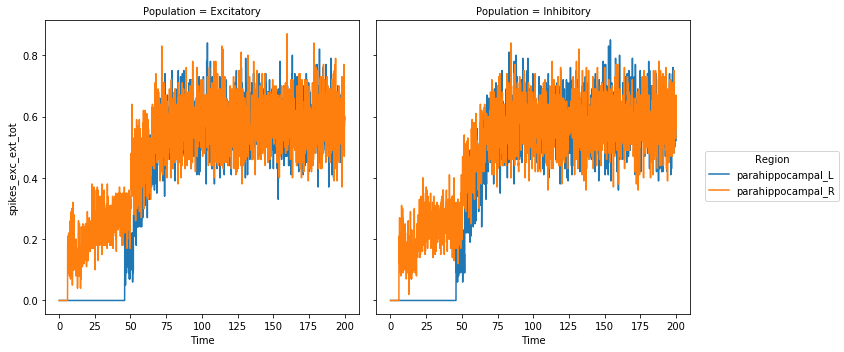

2019-12-19 12:14:03,547 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:14:03,573 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:14:03,590 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:14:03,613 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:14:03,644 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:14:03,670 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:14:03,697 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:14:03,713 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:14:03,756 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:14:03,771 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:14:03,798 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:14:03,813 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:14:03,845 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:14:03,860 -

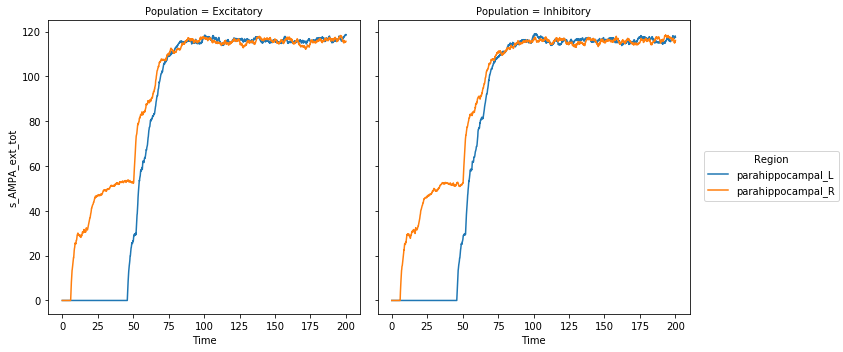

2019-12-19 12:14:04,050 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:14:04,080 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:14:04,097 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:14:04,116 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:14:04,139 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:14:04,162 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:14:04,193 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:14:04,217 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:14:04,261 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:14:04,281 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:14:04,318 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:14:04,342 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:14:04,382 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:14:04,401 -

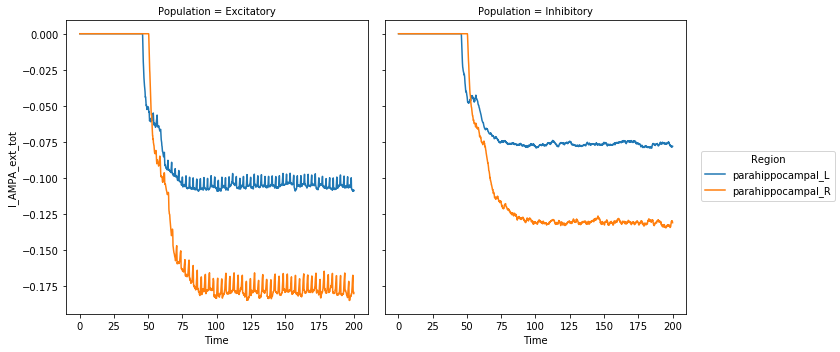

2019-12-19 12:14:04,572 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:14:04,596 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:14:04,611 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:14:04,636 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:14:04,659 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:14:04,679 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:14:04,707 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:14:04,723 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:14:04,761 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:14:04,775 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:14:04,800 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:14:04,814 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:14:04,850 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:14:04,867 -

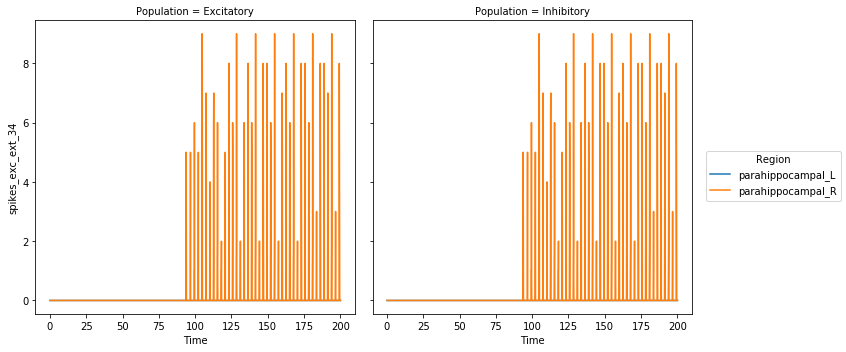

2019-12-19 12:14:05,128 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:14:05,156 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:14:05,173 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:14:05,190 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:14:05,210 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:14:05,230 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:14:05,258 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:14:05,274 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:14:05,314 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:14:05,329 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:14:05,357 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:14:05,371 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:14:05,404 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:14:05,419 -

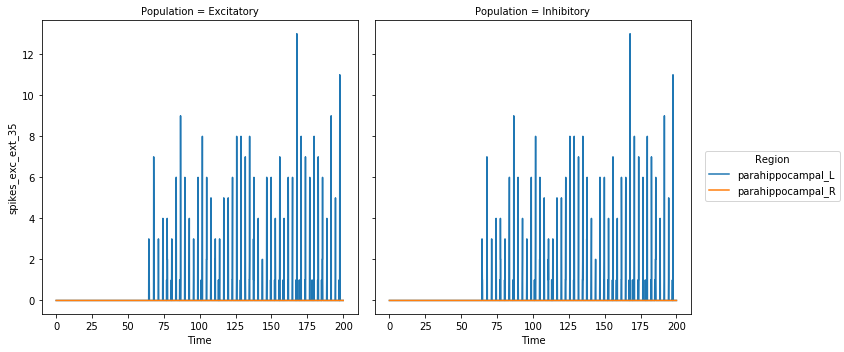

2019-12-19 12:14:05,580 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:14:05,610 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:14:05,624 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:14:05,641 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:14:05,660 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:14:05,679 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:14:05,706 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:14:05,720 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:14:05,762 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:14:05,776 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:14:05,800 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:14:05,814 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:14:05,849 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:14:05,863 -

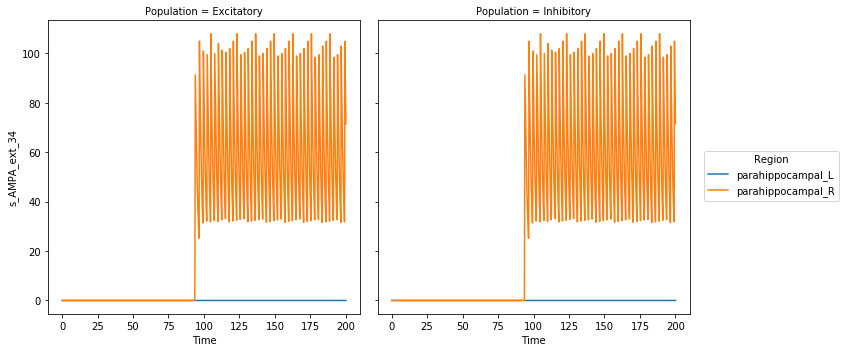

2019-12-19 12:14:06,047 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:14:06,071 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:14:06,085 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:14:06,106 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:14:06,126 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:14:06,144 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:14:06,175 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:14:06,190 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:14:06,243 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:14:06,260 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:14:06,293 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:14:06,309 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:14:06,350 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:14:06,364 -

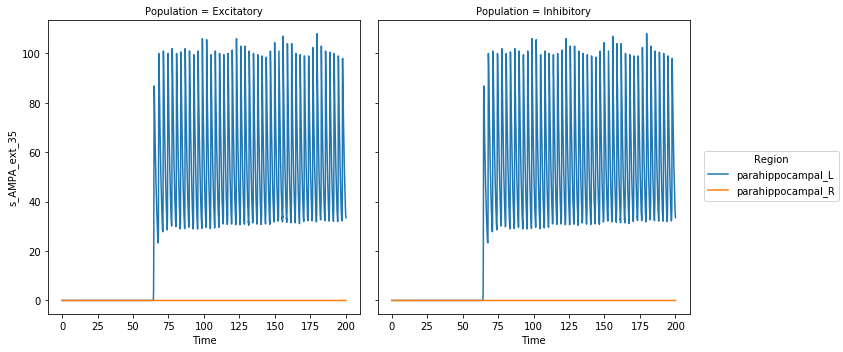

2019-12-19 12:14:06,540 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:14:06,563 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:14:06,580 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:14:06,602 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:14:06,622 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:14:06,647 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:14:06,676 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:14:06,691 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:14:06,736 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:14:06,751 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:14:06,782 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:14:06,798 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:14:06,848 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:14:06,863 -

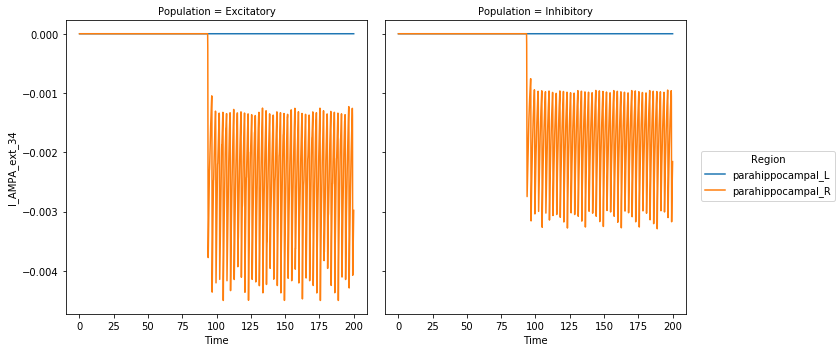

2019-12-19 12:14:07,037 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:14:07,065 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:14:07,081 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:14:07,101 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:14:07,133 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:14:07,179 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:14:07,208 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:14:07,224 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:14:07,272 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:14:07,289 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:14:07,319 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:14:07,335 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:14:07,377 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:14:07,401 -

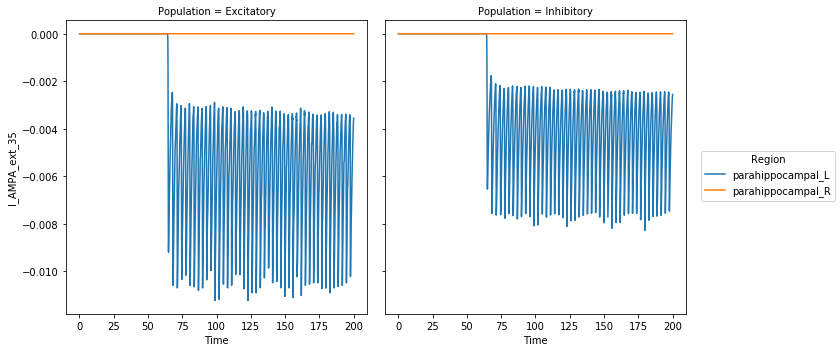

2019-12-19 12:14:07,577 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:14:07,598 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:14:07,612 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:14:07,631 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:14:07,651 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:14:07,677 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:14:07,714 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:14:07,731 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:14:07,779 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:14:07,804 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:14:07,835 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:14:07,853 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:14:07,893 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:14:07,910 -

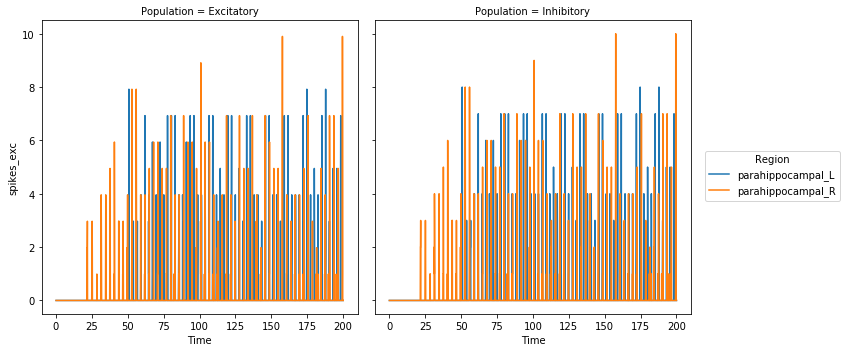

2019-12-19 12:14:08,082 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:14:08,104 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:14:08,123 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:14:08,142 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:14:08,164 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:14:08,185 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:14:08,214 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:14:08,231 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:14:08,296 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:14:08,318 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:14:08,354 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:14:08,371 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:14:08,420 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:14:08,434 -

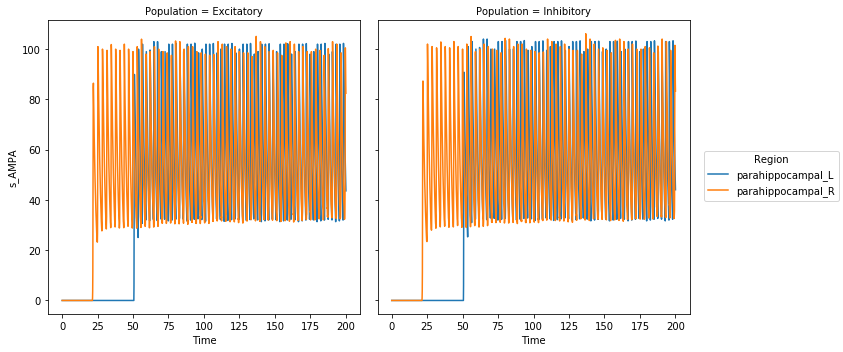

2019-12-19 12:14:08,616 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:14:08,639 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:14:08,653 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:14:08,676 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:14:08,697 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:14:08,718 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:14:08,747 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:14:08,765 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:14:08,821 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:14:08,839 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:14:08,866 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:14:08,883 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:14:08,926 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:14:08,941 -

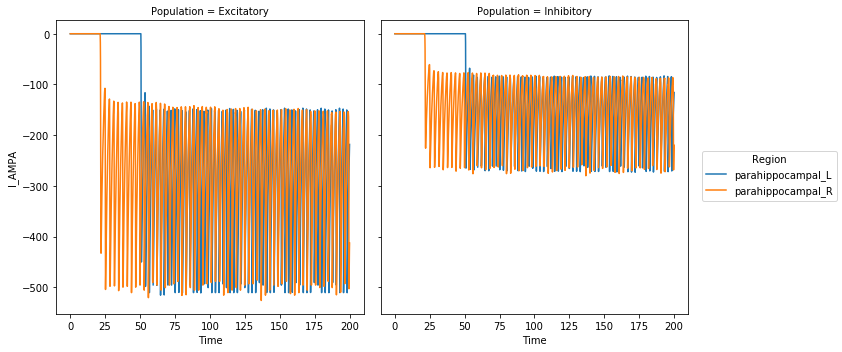

2019-12-19 12:14:09,140 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:14:09,167 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:14:09,183 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:14:09,207 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:14:09,230 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:14:09,250 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:14:09,282 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:14:09,298 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:14:09,364 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:14:09,383 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:14:09,417 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:14:09,440 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:14:09,492 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:14:09,509 -

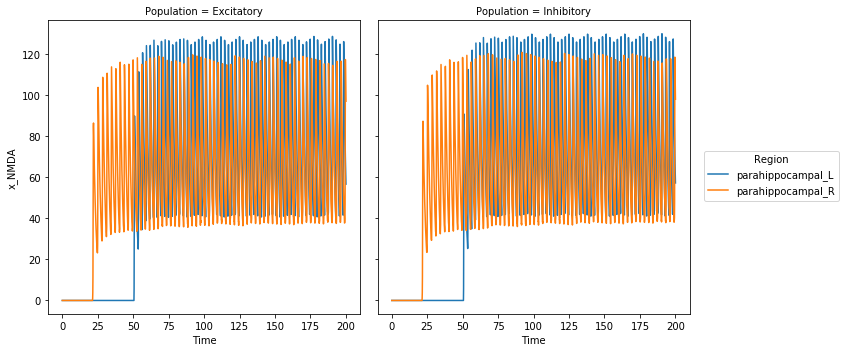

2019-12-19 12:14:09,685 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:14:09,708 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:14:09,728 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:14:09,746 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:14:09,766 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:14:09,782 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:14:09,811 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:14:09,826 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:14:09,863 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:14:09,878 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:14:09,904 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:14:09,921 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:14:09,953 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:14:09,967 -

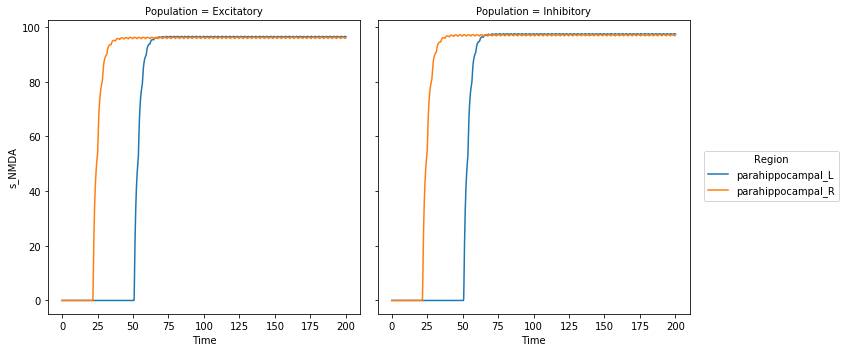

2019-12-19 12:14:10,213 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:14:10,241 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:14:10,259 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:14:10,277 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:14:10,296 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:14:10,317 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:14:10,345 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:14:10,362 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:14:10,407 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:14:10,425 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:14:10,452 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:14:10,466 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:14:10,498 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:14:10,512 -

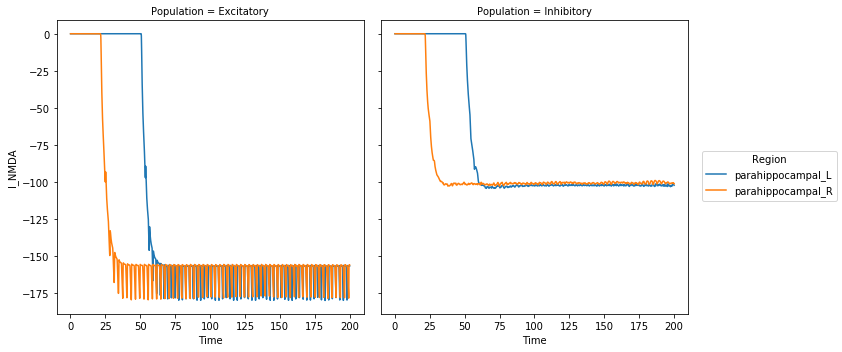

2019-12-19 12:14:10,677 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:14:10,699 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:14:10,719 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:14:10,739 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:14:10,759 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:14:10,779 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:14:10,807 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:14:10,822 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:14:10,860 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:14:10,879 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:14:10,906 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:14:10,921 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:14:10,953 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:14:10,968 -

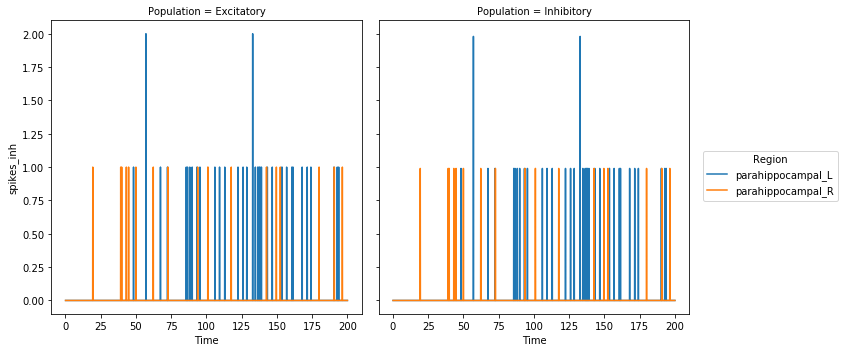

2019-12-19 12:14:11,163 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:14:11,193 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:14:11,210 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:14:11,229 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:14:11,250 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:14:11,268 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:14:11,295 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:14:11,312 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:14:11,397 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:14:11,414 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:14:11,461 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:14:11,477 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:14:11,526 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:14:11,540 -

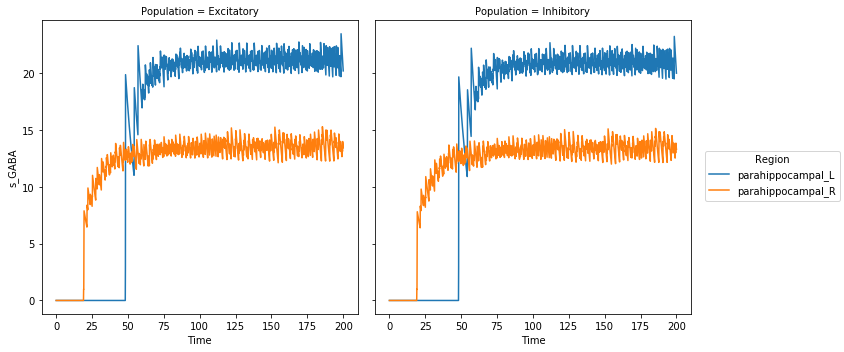

2019-12-19 12:14:11,716 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:14:11,753 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:14:11,768 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:14:11,786 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:14:11,806 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:14:11,825 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:14:11,852 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:14:11,869 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:14:11,910 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:14:11,927 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:14:11,959 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:14:11,978 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:14:12,012 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:14:12,027 -

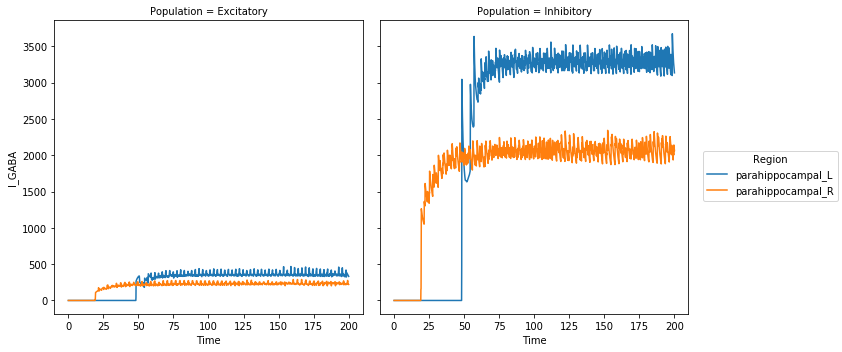

2019-12-19 12:14:12,194 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:14:12,218 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:14:12,236 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:14:12,255 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:14:12,274 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:14:12,295 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:14:12,325 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:14:12,342 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:14:12,389 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:14:12,408 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:14:12,436 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:14:12,454 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:14:12,488 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:14:12,504 -

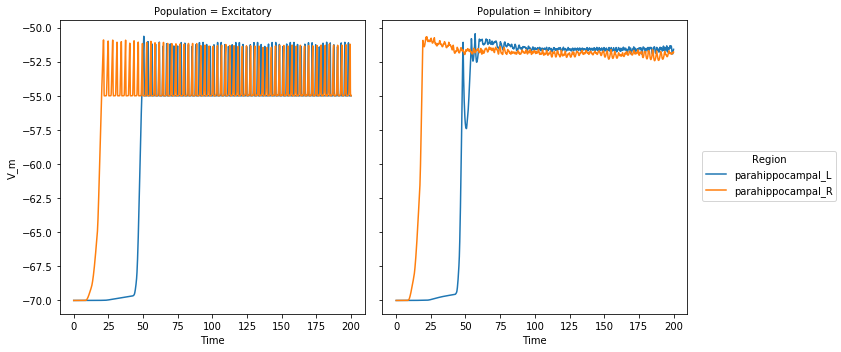

2019-12-19 12:14:12,667 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:14:12,688 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:14:12,702 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:14:12,721 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:14:12,745 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:14:12,771 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:14:12,800 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:14:12,816 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:14:12,861 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:14:12,877 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:14:12,907 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:14:12,923 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:14:12,958 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:14:12,976 -

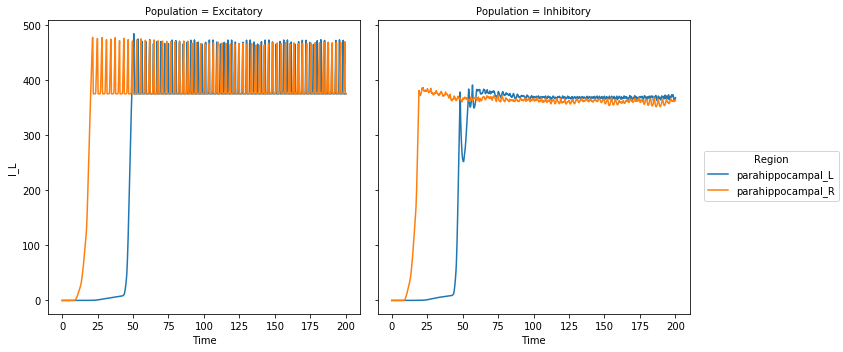

2019-12-19 12:14:13,172 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:14:13,195 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:14:13,210 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:14:13,228 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:14:13,251 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:14:13,267 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:14:13,294 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:14:13,309 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:14:13,345 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:14:13,364 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:14:13,396 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:14:13,411 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:14:13,440 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:14:13,458 -

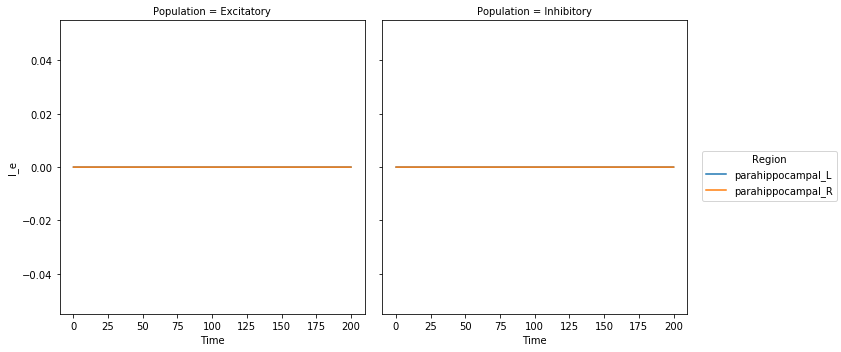

In [26]:
# ts.plot(plotter=plotter, )
for this_ts in [ts_ext, ts_exc, ts_inh, ts_neuron]:
    for var in this_ts.labels_dimensions[this_ts.labels_ordering[1]]:
        temp = this_ts[:, var]
        temp._data.name = "Mean %s data from NEST multimeter" % var
        temp.title = temp._data.name
        temp.plot_timeseries(plotter=plotter, figsize=(10, 5))
# ts_ext.plot_timeseries(plotter=plotter, per_variable=True, figsize=(10, 5))
# ts_exc.plot_timeseries(plotter=plotter, per_variable=True, figsize=(10, 5))
# ts_inh.plot_timeseries(plotter=plotter, per_variable=True, figsize=(10, 5))
# ts_neuron.plot_timeseries(plotter=plotter, per_variable=True, figsize=(10, 5))

In [27]:
# ts_ext.plot_raster(plotter=plotter, per_variable=True, linestyle="--", alpha=1.0, linewidth=0.5, figsize=(10, 5))
# ts_exc.plot_raster(plotter=plotter, per_variable=True, linestyle="--", alpha=1.0, linewidth=0.5, figsize=(10, 5))
# ts_inh.plot_raster(plotter=plotter, per_variable=True, linestyle="--", alpha=1.0, linewidth=0.5, figsize=(10, 5))
# ts_neuron.plot_raster(plotter=plotter, per_variable=True, linestyle="--", alpha=1.0, linewidth=0.5, figsize=(10, 5))

### Plotting NEST network spiking activity using xarray

2019-12-19 12:14:15,117 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:14:15,139 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:14:15,164 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:14:15,184 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:14:15,209 - DEBUG - matplotlib.colorbar - locator: <matplotlib.colorbar._ColorbarAutoLocator object at 0x7f48806af9b0>
2019-12-19 12:14:15,210 - DEBUG - matplotlib.colorbar - Using auto colorbar locator on colorbar
2019-12-19 12:14:15,212 - DEBUG - matplotlib.colorbar - locator: <matplotlib.colorbar._ColorbarAutoLocator object at 0x7f48806af9b0>
2019-12-19 12:14:15,214 - DEBUG - matplotlib.colorbar - Setting pcolormesh
2019-12-19 12:14:15,229 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:14:16,173 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:14:17,141 - DEBUG - matplotlib.axes._base - update_title_pos
2019-12-19 12:14:18,124 - DEBUG - matp

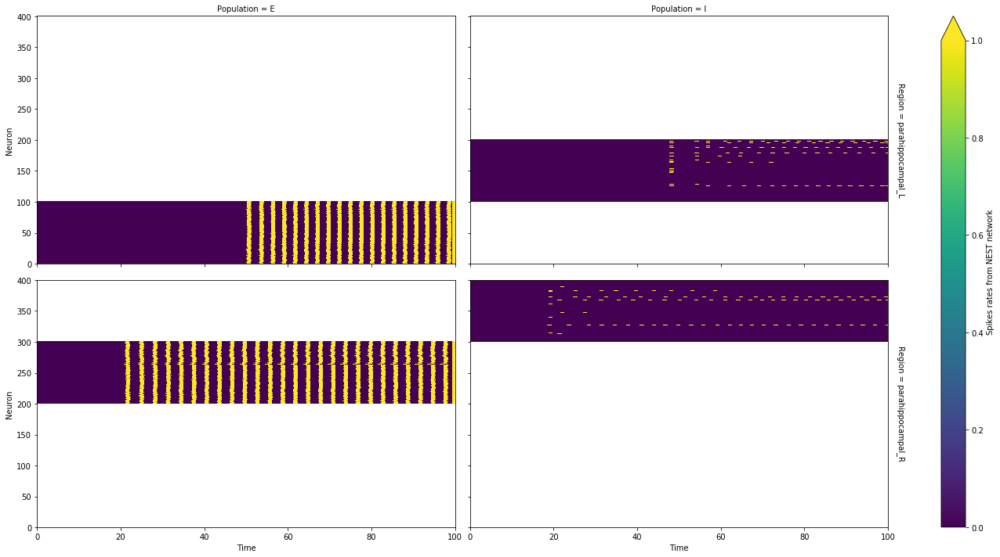

In [28]:
rates = nest_network.compute_spikes_rates(
            mode="per_neuron", population_devices=None, regions=None,
            devices_dim_name="Population", name="Spikes rates from NEST network",
            spikes_kernel_width=1.0, # spikes_kernel_n_intervals=10,
            spikes_kernel_overlap=0.5, min_spike_interval=None, time=np.arange(0, 100.0, 0.01),
            spikes_kernel=None)[0]

rates.plot(x=rates.dims[0], y=rates.dims[3], row=rates.dims[2], col=rates.dims[1], robust=True, figsize=(20, 10))
plotter.base._save_figure(figure_name="Spike rates per neuron")

# Next steps


### 1. Confirm spiking neuron model by reproducing qualitatively the mean field dynamics (e.g., bifurcations) the theory predicts

???Which interfaces should I test???


### 2. Fine tune the TVB -> NEST coupling by reproducing qualitatively the mean field dynamics under TVB input first for one-region NEST spiking network, and then for 2-region or 3-region interacting ones



### 3. Parameter investigation of TVB -> NEST coupling for robustness around the point of fine tuning

Possible parameters to vary:

1. Order (i.e., number) of spiking neurons per population (to also investigate computational efficiency...)

2. Total strength/scaling of TVB large scale coupling, G

3. Feedback inhibition parameter J_i


??? How to scale parameters with the order of spiking neurons per population, so that the input a single neuron receives remains the same ???

For instance...

I could keep the total number of connections per neuron the same by applying a sparse neuronal connectivity...

or...

I could downscale the connections' weights...

# Future work

Use co-simulation in memory consolidation networks

# References

1 Paula Sanz Leon, Stuart A. Knock, M. Marmaduke Woodman, Lia Domide, <br>
  Jochen Mersmann, Anthony R. McIntosh, Viktor Jirsa (2013) <br>
  The Virtual Brain: a simulator of primate brain network dynamics. <br>
  Frontiers in Neuroinformatics (7:10. doi: 10.3389/fninf.2013.00010) <br>
  https://www.thevirtualbrain.org/tvb/zwei <br>
  https://github.com/the-virtual-brain <br>

2 Ritter P, Schirner M, McIntosh AR, Jirsa VK. 2013.  <br>
  The Virtual Brain integrates computational modeling  <br>
  and multimodal neuroimaging. Brain Connectivity 3:121–145. <br>
   
3 Deco Gustavo, Ponce Alvarez Adrian, Dante Mantini, Gian Luca Romani, <br>
  Patric Hagmann and Maurizio Corbetta. <br>
  Resting-State Functional Connectivity Emerges from Structurally and <br>
  Dynamically Shaped Slow Linear Fluctuations. <br>
  The Journal of Neuroscience 32(27), 11239-11252, 2013.<br>

4 Jordan, Jakob; Mørk, Håkon; Vennemo, Stine Brekke;   Terhorst, Dennis; Peyser, <br>
  Alexander; Ippen, Tammo; Deepu, Rajalekshmi;   Eppler, Jochen Martin; <br>
  van Meegen, Alexander;   Kunkel, Susanne; Sinha, Ankur; Fardet, Tanguy; Diaz, <br>
  Sandra; Morrison, Abigail; Schenck, Wolfram; Dahmen, David;   Pronold, Jari; <br>
  Stapmanns, Jonas;   Trensch, Guido; Spreizer, Sebastian;   Mitchell, Jessica; <br>
  Graber, Steffen; Senk, Johanna; Linssen, Charl; Hahne, Jan; Serenko, Alexey; <br>
  Naoumenko, Daniel; Thomson, Eric;   Kitayama, Itaru; Berns, Sebastian;   <br>
  Plesser, Hans Ekkehard <br>
  NEST is a simulator for spiking neural network models that focuses <br>
  on the dynamics, size and structure of neural systems rather than on <br>
  the exact morphology of individual neurons. <br>
  For further information, visit http://www.nest-simulator.org. <br>
  The release notes for this release are available at  <br>
  https://github.com/nest/nest-simulator/releases/tag/v2.18.0 <br>